# **All Locations Total**

After doing some tests and knowing the issues with data. The forecast is done for each artikel for all locations.


The estimation is for each artikel separately. We take data start point as 2017 and then use 3 years to forecast the next year. And we take weekly peaks

### The following steps are taken:

##### *Algorithm Validation*
- The algorithm is trained on data from 2017 till 2019 and a prediction is done for 2020.
- This is validated against 2020 data.

##### *Analysis for 2021- Effect of Corona*
- The newly validated alogrithm is now trained until 2020 and a prediction is made for 2021.
- This shows the effect of corona

##### *Forecast for 2022*
- The newly validated alogrithm is now trained until 2021 and a prediction is made for 2022.

In [1]:
#loading libraries and functions
import os 
import sys
sys.path.append('/home/amey/Projects/BUKO_Forecasting/Modelling/model')
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import forecasting_functions as ff
import importlib
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.preprocessing import StandardScaler
dirname='/home/amey/Projects/BUKO_Forecasting/'
forecast_data=os.path.join(dirname,'Modelling','forecast_processed_data')

In [16]:
def normaliser(ts,inverse=False):
    tsvalues=ts.values.reshape((len(ts.values), 1))
    scaler=StandardScaler()
    scaler=scaler.fit(tsvalues)
    transformed=scaler.transform(tsvalues)
    if inverse==True:
        transformed=scaler.inverse_transform(tsvalues)
    ts.iloc[:]=transformed.ravel()
    return (ts)
    

## **J16-90**

In [18]:

importlib.reload(ff)
region='All Locations_normalised' 
artikel_code='J16-90'
ini_start_year_train=2017
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))

train_ts=train_ts[2:]


#normalising
train_ts=normaliser(train_ts)
print('Training series is:'+str(train_ts))

Training series is:2016-12-25   -1.519849
2017-01-01   -1.824542
2017-01-08   -2.806633
2017-01-15   -2.612119
2017-01-22   -2.153719
                ...   
2019-12-01    1.610055
2019-12-08    1.444106
2019-12-15    1.117650
2019-12-22    0.825199
2019-12-29    0.019939
Name: Net_week_art, Length: 158, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9376419200356373
0.33468473868406895
0.8639357713055407
0.9310054938713364
0.3636185895378595


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

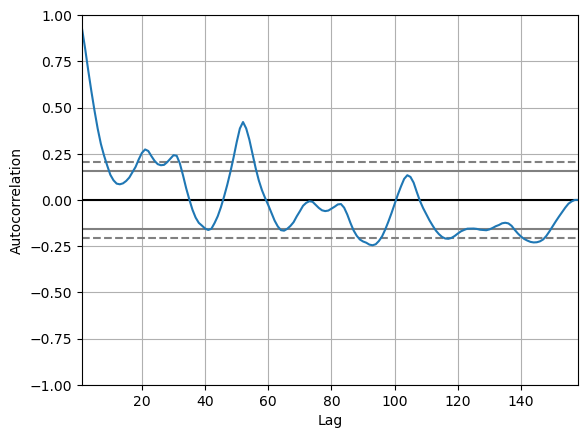

In [19]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

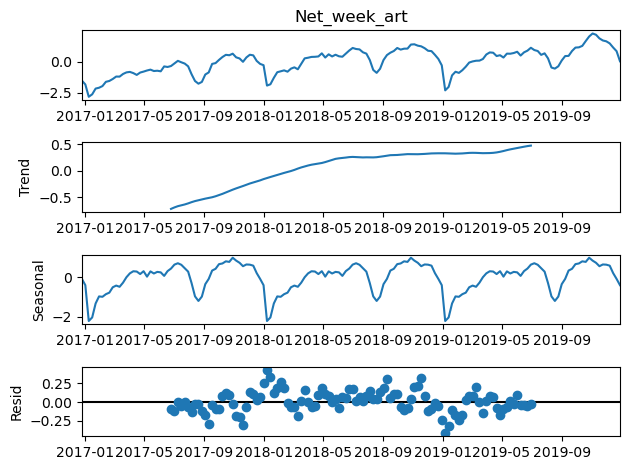

In [20]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [21]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


ValueError: endog must be strictly positive when usingmultiplicative trend or seasonal components.

Testing for the fitting of model versus observed data.

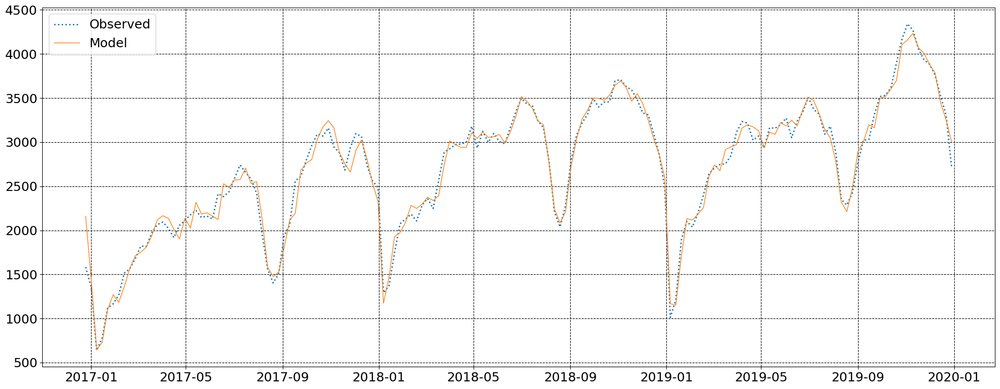

In [46]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)


Testing for forecasting on 2020.

In [47]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2017-01-01    1359.0
2017-01-08     637.0
2017-01-15     780.0
2017-01-22    1117.0
2017-01-29    1166.0
               ...  
2020-11-29    4162.0
2020-12-06    4322.0
2020-12-13    4073.0
2020-12-20    3970.0
2020-12-27    3311.0
Name: Net_week_art, Length: 209, dtype: float64
2019-12-29    2715.0
2020-01-05    1521.0
2020-01-12    1279.0
2020-01-19    2080.0
Name: Net_week_art, dtype: float64


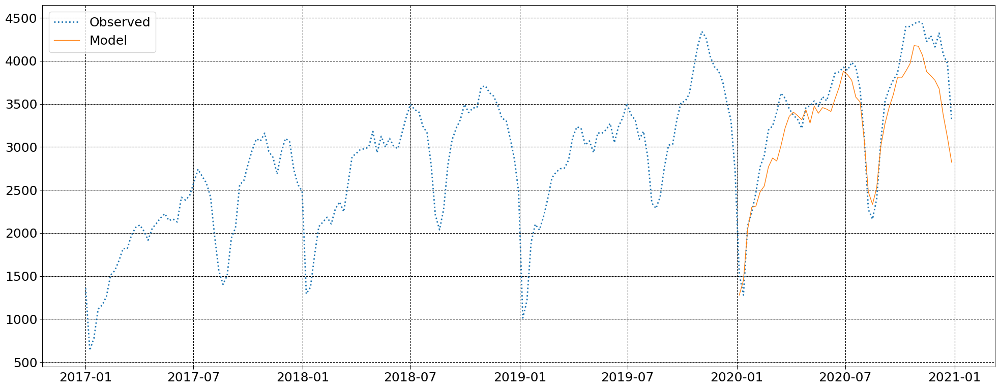

In [48]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# no need of below logic since initial estimation is used later
# ini_value=1521
# if np.abs(mod_result.fcastvalues[0]-ini_value)>500:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2020=forecast_2020-ini_value
#     else:
#         forecast_2020=ini_value-forecast_2020
# else:
#     forecast_2020=forecast_2020
mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,fname)

In [49]:
#2021 forecast time series
forecast_2020=mod_result.forecast(52)
forecast_2020=forecast_2020.round()
df=pd.DataFrame(forecast_2020,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_20.csv')
pd.Series.to_csv(df,fname)

### Validation

(Corona effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [50]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2017-12-31    2486.0
2018-01-07    1292.0
2018-01-14    1369.0
2018-01-21    1746.0
2018-01-28    2074.0
               ...  
2020-11-29    4162.0
2020-12-06    4322.0
2020-12-13    4073.0
2020-12-20    3970.0
2020-12-27    3311.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        3407922.693
Optimized:                         True   AIC                           1681.703
Trend:                         Additive   BIC                           1855.909
Seasonal:                Multiplicative   AICC                          1754.692
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         08:38:06
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.5707144                alpha                 True
smoothing_trend          

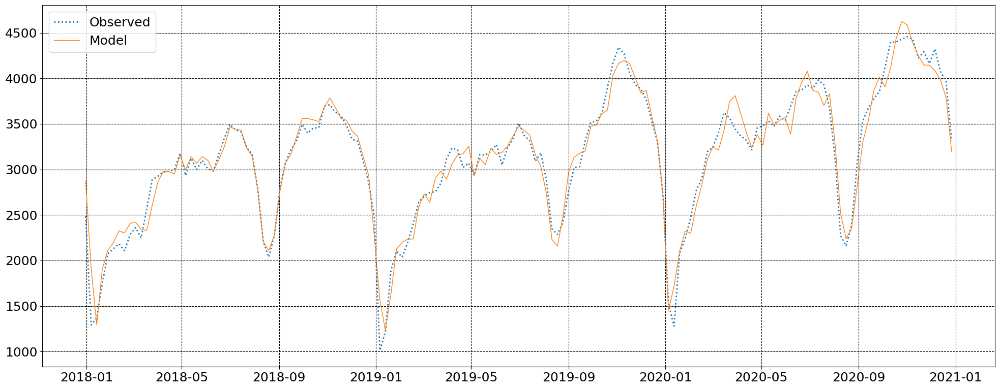

In [51]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

*Forecast for 2021*

In [52]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
# print(vald21_ts[-53:-49])

2018-12-30    2477.0
2019-01-06    1013.0
2019-01-13    1214.0
2019-01-20    1890.0
2019-01-27    2102.0
               ...  
2021-12-05    5134.0
2021-12-12    5222.0
2021-12-19    5100.0
2021-12-26    4841.0
2022-01-02    3952.0
Name: Net_week_art, Length: 158, dtype: float64


Plotting against observed

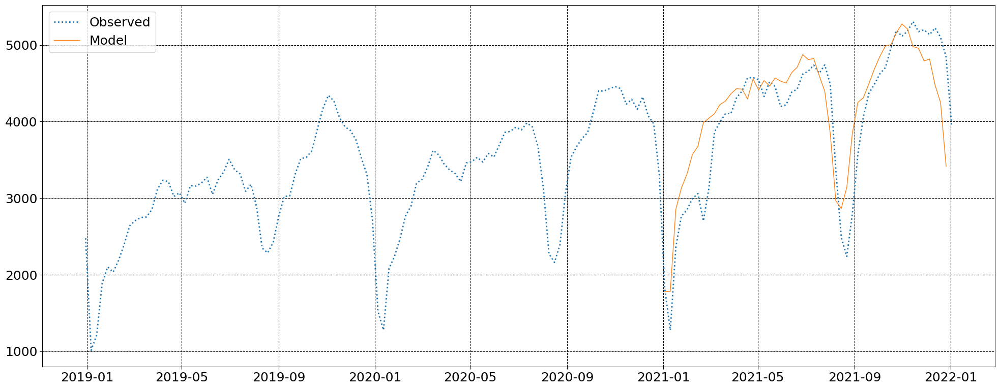

In [53]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
# ini_value=1276
# if np.abs(mod_result.fcastvalues[0]-ini_value)>1000:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2021=forecast_2021-ini_value
#     else:
#         forecast_2021=ini_value-forecast_2021
# else:
#     forecast_2021=forecast_2021
fname=os.path.join(artikel_data_loc,'Validation_forecast_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,fname)

In [54]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
df=pd.DataFrame(forecast_2021,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_21.csv')
pd.Series.to_csv(df,fname)

### Forecast 2022

Train data till 2021


In [ ]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52+0)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+3]
print(train_ts)

2018-12-30    2477.0
2019-01-06    1013.0
2019-01-13    1214.0
2019-01-20    1890.0
2019-01-27    2102.0
               ...  
2021-12-12    5222.0
2021-12-19    5100.0
2021-12-26    4841.0
2022-01-02    3952.0
2022-01-09    1813.0
Name: Net_week_art, Length: 159, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  159
Model:             ExponentialSmoothing   SSE                        6750952.254
Optimized:                         True   AIC                           1808.350
Trend:                         Additive   BIC                           1983.278
Seasonal:                Multiplicative   AICC                          1879.865
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         08:39:33
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.7474995                alpha                 True
smoothing_trend          

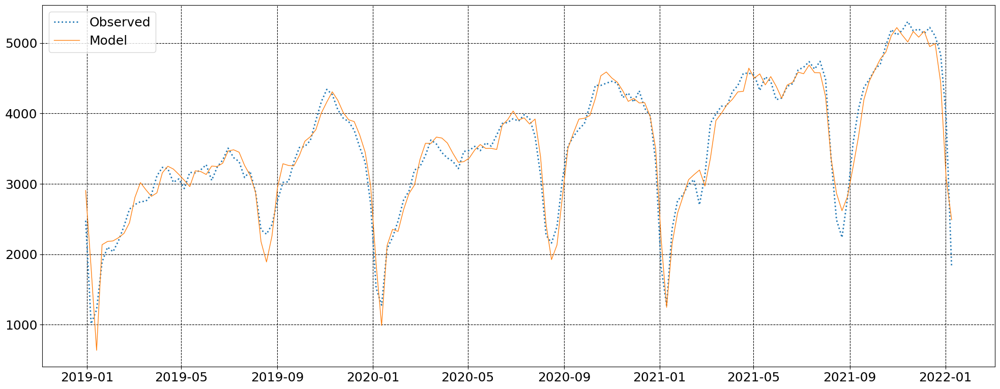

In [ ]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [ ]:
#2021 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2019-12-29    2715.0
2020-01-05    1521.0
2020-01-12    1279.0
2020-01-19    2080.0
2020-01-26    2240.0
               ...  
2022-12-04    5906.0
2022-12-11    5762.0
2022-12-18    5586.0
2022-12-25    5070.0
2023-01-01    4040.0
Name: Net_week_art, Length: 158, dtype: float64


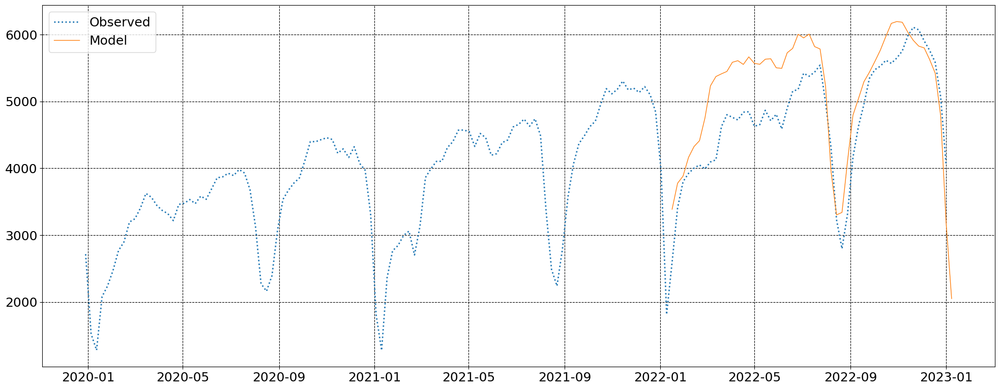

In [ ]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,fname)

In [ ]:
#2021 forecast time series
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
df=pd.DataFrame(forecast_2022,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_22.csv')
pd.Series.to_csv(df,fname)

### Forecast 2023

Train data till 2022


In [67]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52+0)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+3]
print(train_ts)

2019-12-29    2715.0
2020-01-05    1521.0
2020-01-12    1279.0
2020-01-19    2080.0
2020-01-26    2240.0
               ...  
2022-12-04    5906.0
2022-12-11    5762.0
2022-12-18    5586.0
2022-12-25    5070.0
2023-01-01    4040.0
Name: Net_week_art, Length: 158, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                        6087623.572
Optimized:                         True   AIC                           1782.349
Trend:                         Additive   BIC                           1956.917
Seasonal:                Multiplicative   AICC                          1854.594
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         08:44:24
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.6767856                alpha                 True
smoothing_trend          

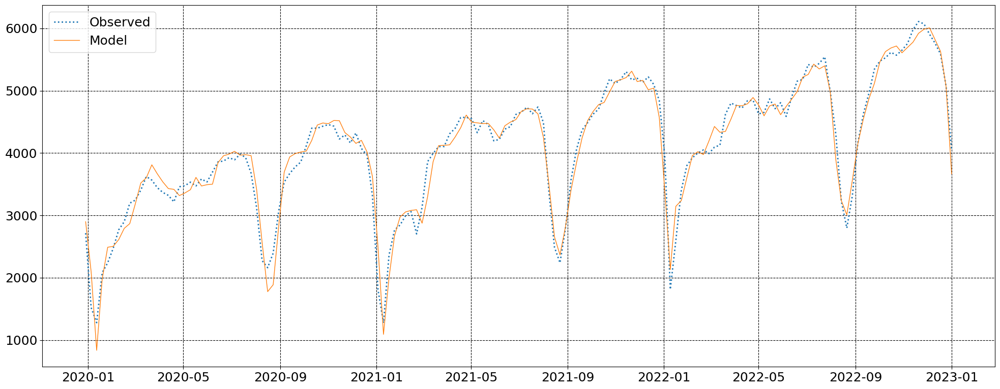

In [68]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [69]:
#2022 observations ts
start_year_train=ini_start_year_train+4
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2020-12-27    3311.0
2021-01-03    1811.0
2021-01-10    1276.0
2021-01-17    2362.0
2021-01-24    2765.0
               ...  
2022-12-04    5906.0
2022-12-11    5762.0
2022-12-18    5586.0
2022-12-25    5070.0
2023-01-01    4040.0
Name: Net_week_art, Length: 106, dtype: float64


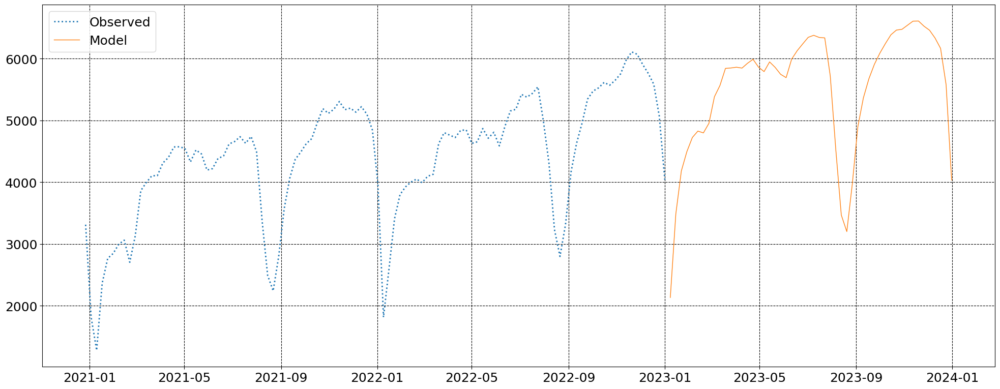

In [70]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,fname)

In [71]:
#2021 forecast time series
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
df=pd.DataFrame(forecast_2023,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_23.csv')
pd.Series.to_csv(df,fname)

##### **END J16-90** 

## **AHEK**

In [2]:

importlib.reload(ff)
region='All Locations'
artikel_code='AHEK'
ini_start_year_train=2017
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2016-12-25    3059.0
2017-01-01    2567.0
2017-01-08    1262.0
2017-01-15    1271.0
2017-01-22    1786.0
               ...  
2019-12-01    6407.0
2019-12-08    6169.0
2019-12-15    5637.0
2019-12-22    5147.0
2019-12-29    4348.0
Name: Net_week_art, Length: 158, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.951061573980367
0.5487558730580233
0.9025078994100099
0.9481645283165003
0.3928501133399597


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

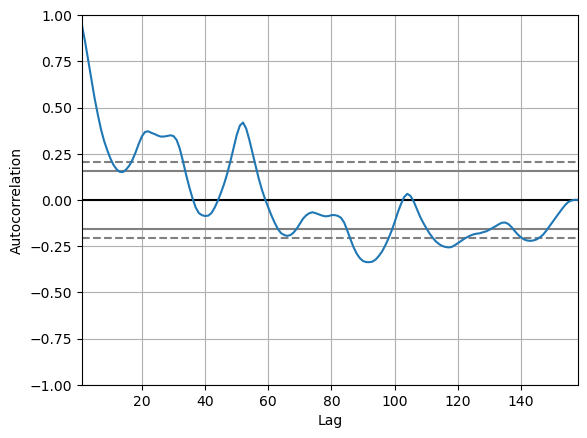

In [3]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

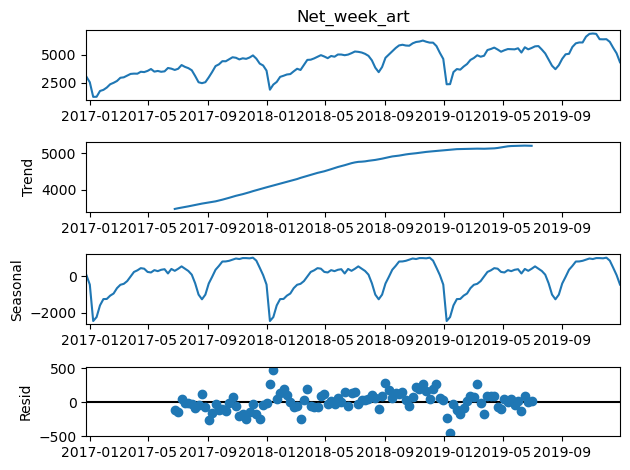

In [4]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [9]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                        3329778.678
Optimized:                         True   AIC                           1687.020
Trend:                   Multiplicative   BIC                           1861.588
Seasonal:                Multiplicative   AICC                          1759.265
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         09:06:31
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.7121429                alpha                 True
smoothing_trend          

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


Testing for the fitting of model versus observed data.

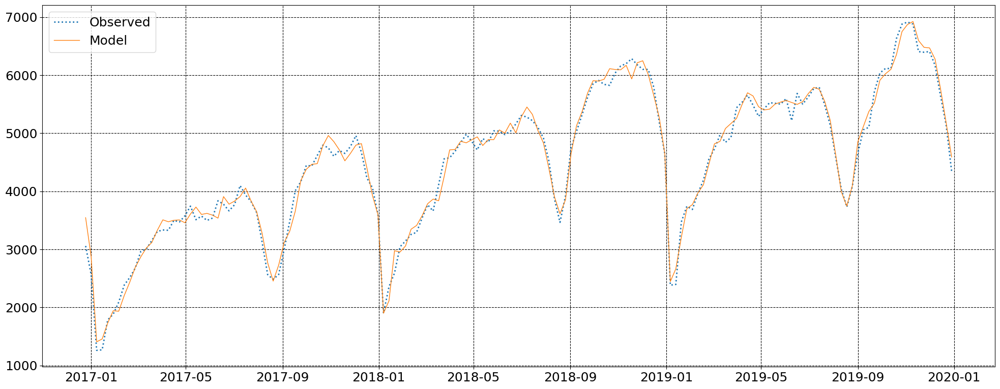

In [10]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)


Testing for forecasting on 2020.

In [11]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2017-01-01    2567.0
2017-01-08    1262.0
2017-01-15    1271.0
2017-01-22    1786.0
2017-01-29    1885.0
               ...  
2020-11-29    6482.0
2020-12-06    6820.0
2020-12-13    6331.0
2020-12-20    6290.0
2020-12-27    5184.0
Name: Net_week_art, Length: 209, dtype: float64
2019-12-29    4348.0
2020-01-05    2336.0
2020-01-12    2122.0
2020-01-19    3324.0
Name: Net_week_art, dtype: float64


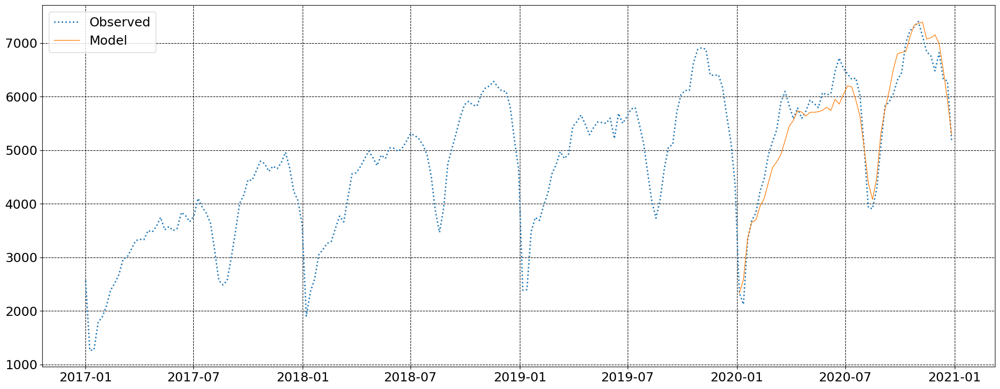

In [12]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# no need of below logic since initial estimation is used later
# ini_value=1521
# if np.abs(mod_result.fcastvalues[0]-ini_value)>500:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2020=forecast_2020-ini_value
#     else:
#         forecast_2020=ini_value-forecast_2020
# else:
#     forecast_2020=forecast_2020
mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,fname)

In [13]:
#2021 forecast time series
forecast_2020=mod_result.forecast(52)
forecast_2020=forecast_2020.round()
df=pd.DataFrame(forecast_2020,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_20.csv')
pd.Series.to_csv(df,fname)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [14]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2017-12-31    3602.0
2018-01-07    1902.0
2018-01-14    2359.0
2018-01-21    2594.0
2018-01-28    3045.0
               ...  
2020-11-29    6482.0
2020-12-06    6820.0
2020-12-13    6331.0
2020-12-20    6290.0
2020-12-27    5184.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                       18725519.046
Optimized:                         True   AIC                           1949.197
Trend:                   Multiplicative   BIC                           2123.403
Seasonal:                Multiplicative   AICC                          2022.187
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         09:06:57
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.1464286                alpha                 True
smoothing_trend          

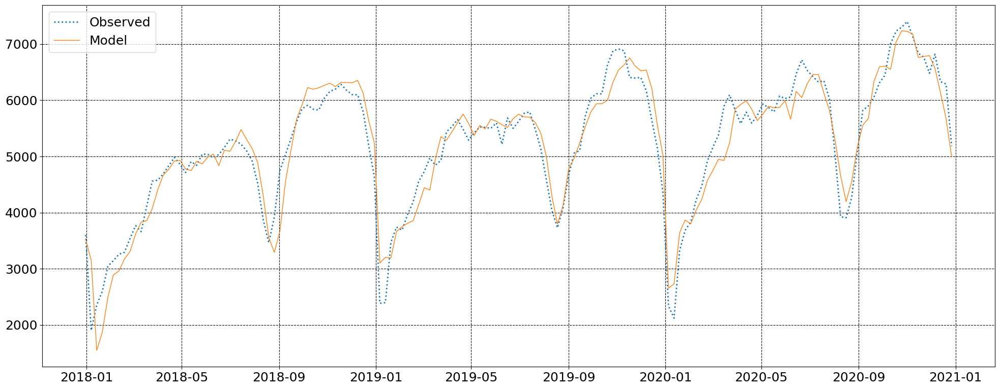

In [15]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

*Forecast for 2021*

In [16]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
print(vald21_ts[-53:-49])

2017-12-31    3602.0
2018-01-07    1902.0
2018-01-14    2359.0
2018-01-21    2594.0
2018-01-28    3045.0
               ...  
2021-12-05    7933.0
2021-12-12    7983.0
2021-12-19    7698.0
2021-12-26    7298.0
2022-01-02    6072.0
Name: Net_week_art, Length: 210, dtype: float64
2021-01-03    3159.0
2021-01-10    2361.0
2021-01-17    4050.0
2021-01-24    4650.0
Name: Net_week_art, dtype: float64


Plotting against observed

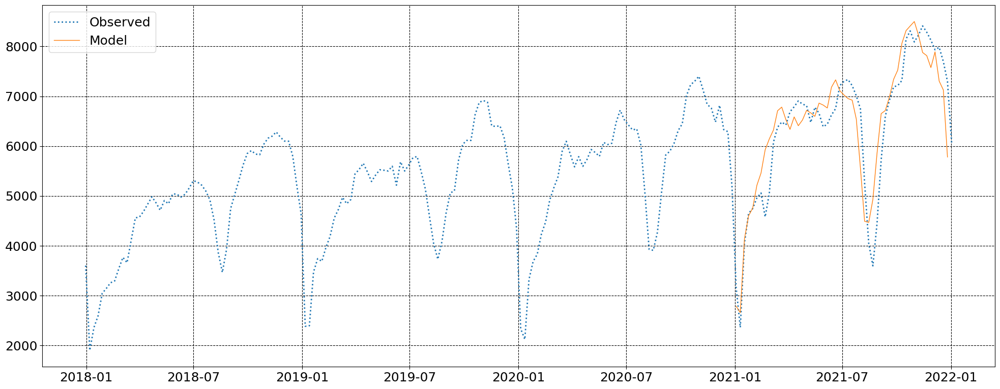

In [17]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
# ini_value=1276
# if np.abs(mod_result.fcastvalues[0]-ini_value)>1000:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2021=forecast_2021-ini_value
#     else:
#         forecast_2021=ini_value-forecast_2021
# else:
#     forecast_2021=forecast_2021
fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,fname)

In [18]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
df=pd.DataFrame(forecast_2021,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_21.csv')
pd.Series.to_csv(df,fname)

### Forecast 2022

Train data till 2021


In [19]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52+0)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-01-06    2385.0
2019-01-13    2397.0
2019-01-20    3474.0
2019-01-27    3743.0
2019-02-03    3688.0
               ...  
2021-11-28    8126.0
2021-12-05    7933.0
2021-12-12    7983.0
2021-12-19    7698.0
2021-12-26    7298.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                       29050622.981
Optimized:                         True   AIC                           2018.144
Trend:                   Multiplicative   BIC                           2192.350
Seasonal:                Multiplicative   AICC                          2091.134
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         09:07:19
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8535714                alpha                 True
smoothing_trend          

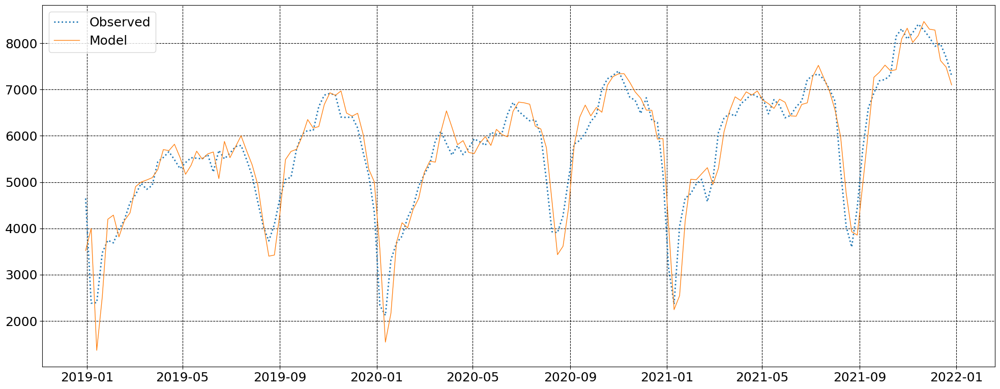

In [20]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [21]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2018-12-30    4646.0
2019-01-06    2385.0
2019-01-13    2397.0
2019-01-20    3474.0
2019-01-27    3743.0
               ...  
2022-12-04    8920.0
2022-12-11    8737.0
2022-12-18    8099.0
2022-12-25    7268.0
2023-01-01    5646.0
Name: Net_week_art, Length: 210, dtype: float64


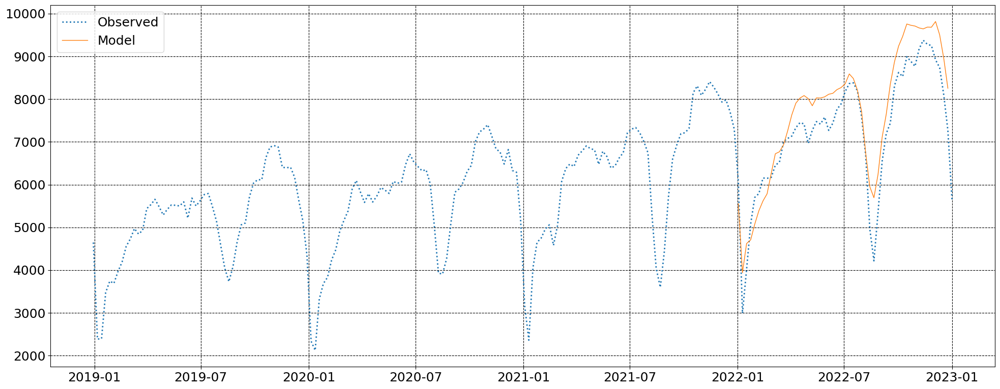

In [23]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,fname)

In [24]:
#2021 forecast time series
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
df=pd.DataFrame(forecast_2022,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_22.csv')
pd.Series.to_csv(df,fname)

### Forecast 2023

Train data till 2022


In [25]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-12-29    4348.0
2020-01-05    2336.0
2020-01-12    2122.0
2020-01-19    3324.0
2020-01-26    3686.0
               ...  
2022-11-20    9284.0
2022-11-27    9255.0
2022-12-04    8920.0
2022-12-11    8737.0
2022-12-18    8099.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                       34814129.743
Optimized:                         True   AIC                           2046.558
Trend:                   Multiplicative   BIC                           2220.764
Seasonal:                Multiplicative   AICC                          2119.548
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         09:09:01
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.6414286                alpha                 True
smoothing_trend          

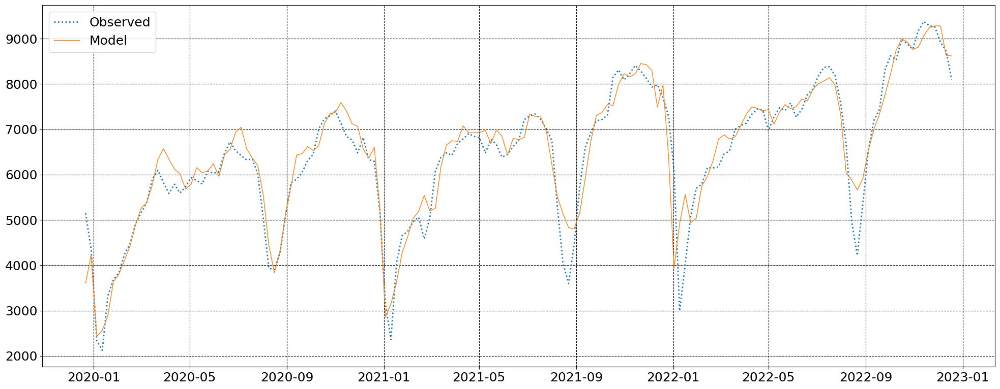

In [37]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [38]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2019-12-29    4348.0
2020-01-05    2336.0
2020-01-12    2122.0
2020-01-19    3324.0
2020-01-26    3686.0
               ...  
2022-12-04    8920.0
2022-12-11    8737.0
2022-12-18    8099.0
2022-12-25    7268.0
2023-01-01    5646.0
Name: Net_week_art, Length: 158, dtype: float64


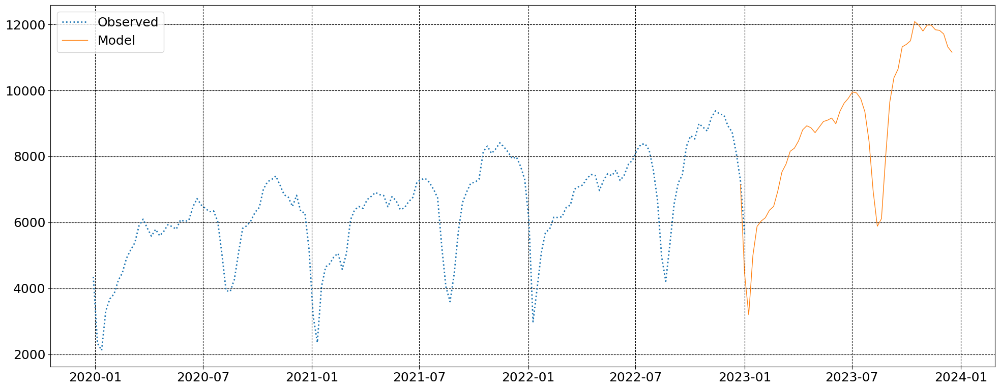

In [39]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,fname)

In [40]:
#2021 forecast time series
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
df=pd.DataFrame(forecast_2023,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_23.csv')
pd.Series.to_csv(df,fname)

## **PB6090**

In [108]:

importlib.reload(ff)
region='All Locations'
artikel_code='PB6090'
ini_start_year_train=2017
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2016-12-25    1795.0
2017-01-01    1445.0
2017-01-08     829.0
2017-01-15    1073.0
2017-01-22    1230.0
               ...  
2019-12-01    3911.0
2019-12-08    3807.0
2019-12-15    3212.0
2019-12-22    2629.0
2019-12-29    2193.0
Name: Net_week_art, Length: 158, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9460900819312478
0.040233657824265995
0.8871822133121559
0.8860931426956562
0.14410120814292823


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

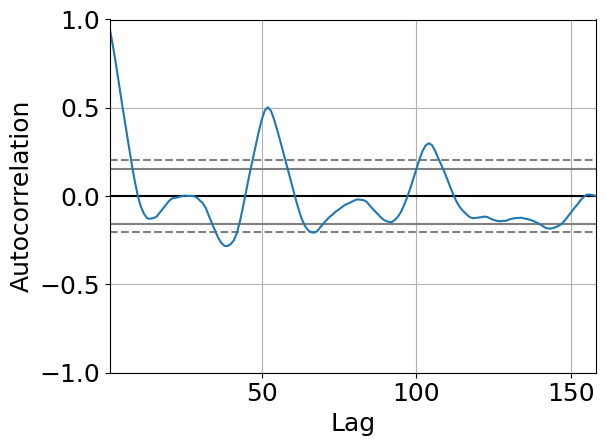

In [109]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

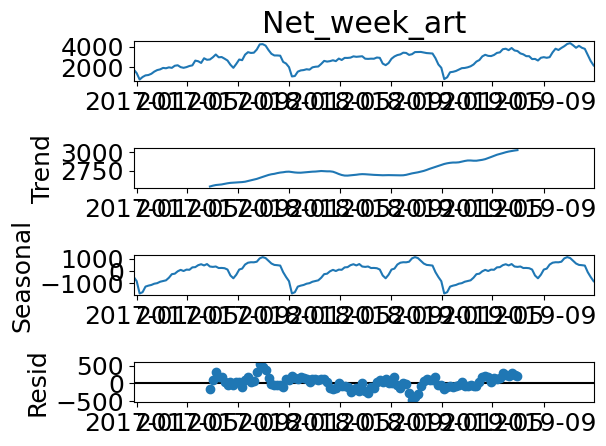

In [110]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [111]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                        2931581.739
Optimized:                         True   AIC                           1666.896
Trend:                         Additive   BIC                           1841.464
Seasonal:                Multiplicative   AICC                          1739.141
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:00:03
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8889282                alpha                 True
smoothing_trend          

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Testing for the fitting of model versus observed data.

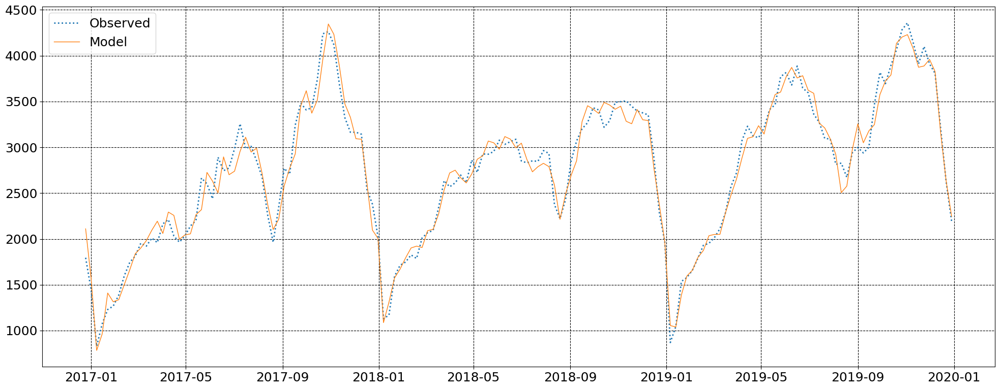

In [112]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)


Testing for forecasting on 2020.

In [113]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2017-01-01    1445.0
2017-01-08     829.0
2017-01-15    1073.0
2017-01-22    1230.0
2017-01-29    1267.0
               ...  
2020-11-29    3970.0
2020-12-06    4093.0
2020-12-13    3986.0
2020-12-20    3799.0
2020-12-27    3075.0
Name: Net_week_art, Length: 209, dtype: float64
2019-12-29    2193.0
2020-01-05    1146.0
2020-01-12    1255.0
2020-01-19    2153.0
Name: Net_week_art, dtype: float64


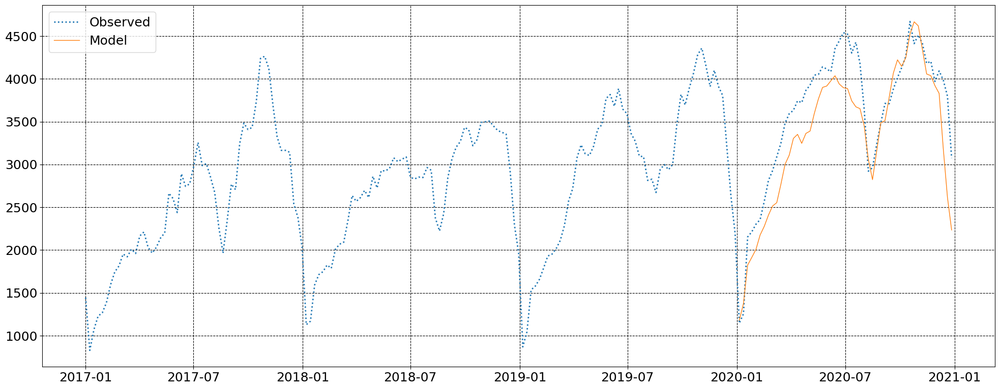

In [114]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# no need of below logic since initial estimation is used later
# ini_value=1521
# if np.abs(mod_result.fcastvalues[0]-ini_value)>500:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2020=forecast_2020-ini_value
#     else:
#         forecast_2020=ini_value-forecast_2020
# else:
#     forecast_2020=forecast_2020
mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,fname)

In [115]:
#2021 forecast time series
forecast_2020=mod_result.forecast(52)
forecast_2020=forecast_2020.round()
df=pd.DataFrame(forecast_2020,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_20.csv')
pd.Series.to_csv(df,fname)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [116]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2017-12-31    2028.0
2018-01-07    1129.0
2018-01-14    1170.0
2018-01-21    1592.0
2018-01-28    1713.0
               ...  
2020-11-29    3970.0
2020-12-06    4093.0
2020-12-13    3986.0
2020-12-20    3799.0
2020-12-27    3075.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        4666056.831
Optimized:                         True   AIC                           1731.034
Trend:                         Additive   BIC                           1905.240
Seasonal:                Multiplicative   AICC                          1804.024
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:00:24
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.5707144                alpha                 True
smoothing_trend          

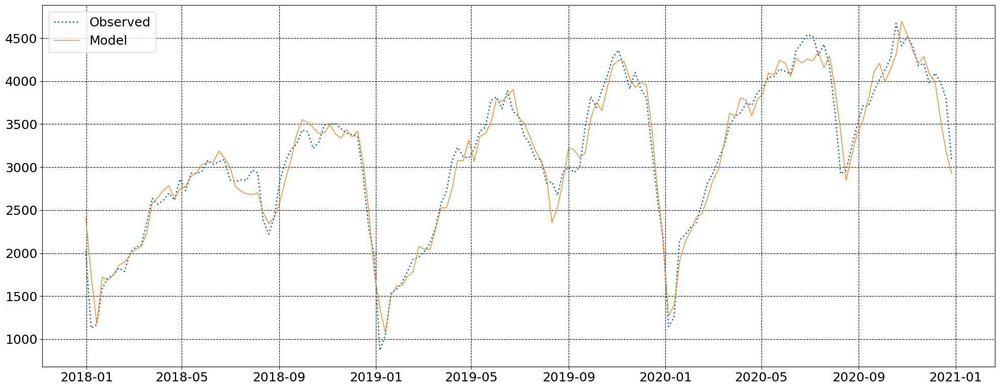

In [117]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

*Forecast for 2021*

In [118]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
print(vald21_ts[-53:-49])

2017-12-31    2028.0
2018-01-07    1129.0
2018-01-14    1170.0
2018-01-21    1592.0
2018-01-28    1713.0
               ...  
2021-12-05    4171.0
2021-12-12    4052.0
2021-12-19    4006.0
2021-12-26    3332.0
2022-01-02    2855.0
Name: Net_week_art, Length: 210, dtype: float64
2021-01-03    1776.0
2021-01-10    1289.0
2021-01-17    2107.0
2021-01-24    2558.0
Name: Net_week_art, dtype: float64


Plotting against observed

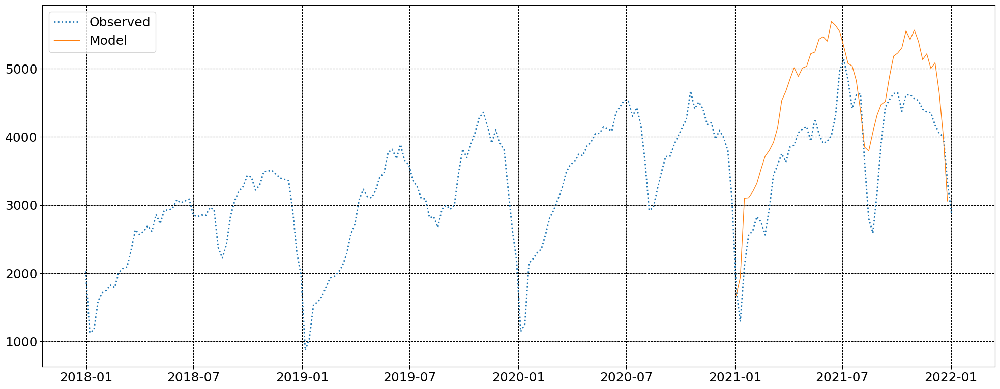

In [119]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
# ini_value=1276
# if np.abs(mod_result.fcastvalues[0]-ini_value)>1000:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2021=forecast_2021-ini_value
#     else:
#         forecast_2021=ini_value-forecast_2021
# else:
#     forecast_2021=forecast_2021
fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,fname)

In [120]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
df=pd.DataFrame(forecast_2021,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_21.csv')
pd.Series.to_csv(df,fname)

### Forecast 2022

Train data till 2021


In [135]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-01-06     870.0
2019-01-13    1045.0
2019-01-20    1536.0
2019-01-27    1579.0
2019-02-03    1658.0
               ...  
2021-11-28    4353.0
2021-12-05    4171.0
2021-12-12    4052.0
2021-12-19    4006.0
2021-12-26    3332.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        7616754.383
Optimized:                         True   AIC                           1807.970
Trend:                         Additive   BIC                           1982.176
Seasonal:                Multiplicative   AICC                          1880.959
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:02:35
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8182141                alpha                 True
smoothing_trend          

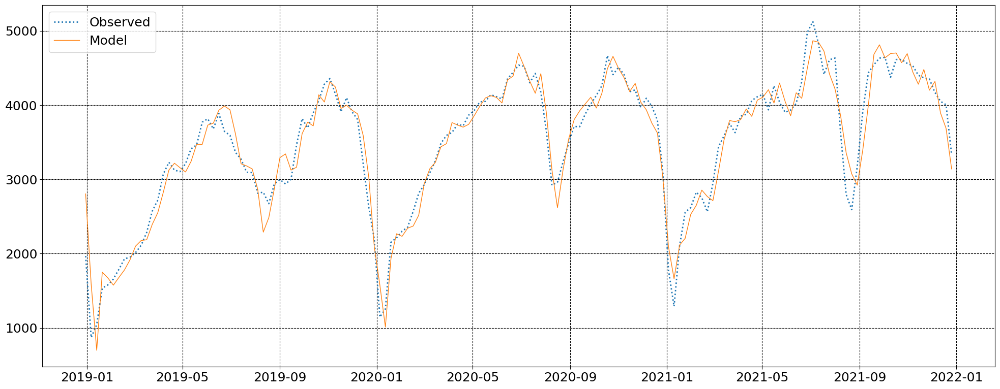

In [136]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [137]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2018-12-30    1968.0
2019-01-06     870.0
2019-01-13    1045.0
2019-01-20    1536.0
2019-01-27    1579.0
               ...  
2022-12-04    5235.0
2022-12-11    5101.0
2022-12-18    4196.0
2022-12-25    4054.0
2023-01-01    3038.0
Name: Net_week_art, Length: 210, dtype: float64


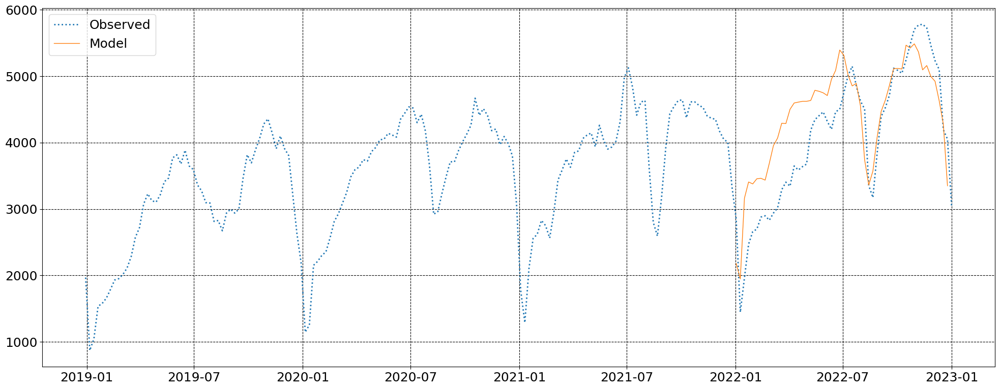

In [138]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,fname)

In [139]:
#2021 forecast time series
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
df=pd.DataFrame(forecast_2022,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_22.csv')
pd.Series.to_csv(df,fname)

### Forecast 2023

Train data till 2022


In [140]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-12-29    2193.0
2020-01-05    1146.0
2020-01-12    1255.0
2020-01-19    2153.0
2020-01-26    2213.0
               ...  
2022-11-20    5729.0
2022-11-27    5462.0
2022-12-04    5235.0
2022-12-11    5101.0
2022-12-18    4196.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        8423718.634
Optimized:                         True   AIC                           1823.780
Trend:                         Additive   BIC                           1997.986
Seasonal:                Multiplicative   AICC                          1896.769
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:02:58
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.7828571                alpha                 True
smoothing_trend          

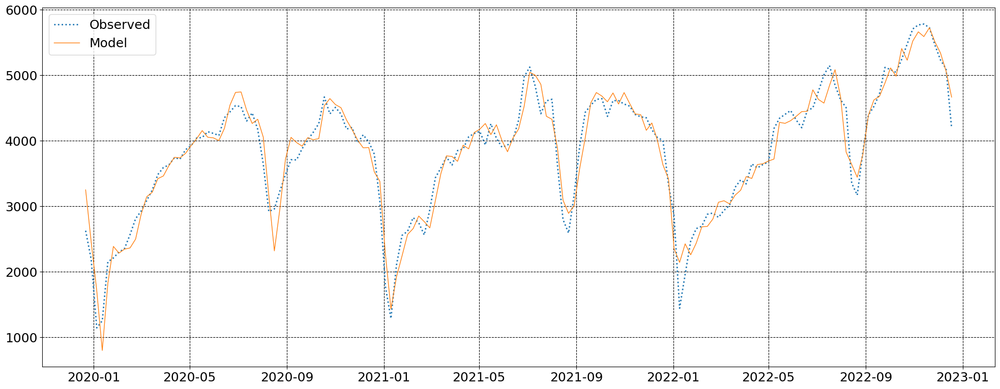

In [142]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [143]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2019-12-29    2193.0
2020-01-05    1146.0
2020-01-12    1255.0
2020-01-19    2153.0
2020-01-26    2213.0
               ...  
2022-12-04    5235.0
2022-12-11    5101.0
2022-12-18    4196.0
2022-12-25    4054.0
2023-01-01    3038.0
Name: Net_week_art, Length: 158, dtype: float64


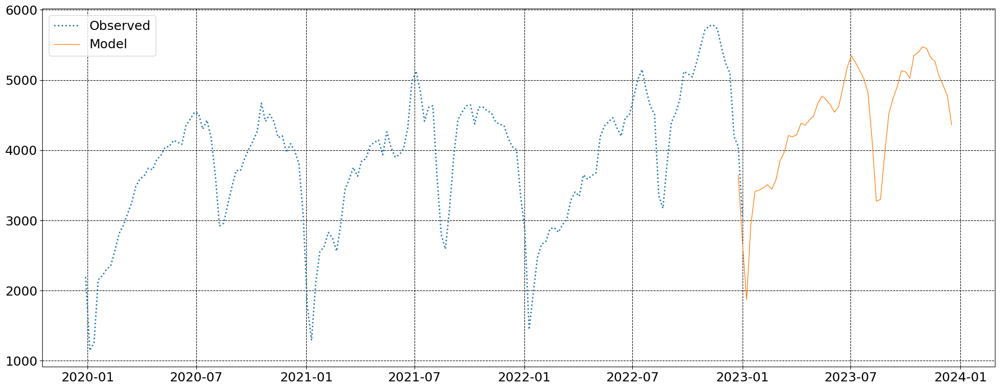

In [144]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,fname)

In [145]:
#2021 forecast time series
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
df=pd.DataFrame(forecast_2023,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_23.csv')
pd.Series.to_csv(df,fname)

## **TB80120**

In [172]:

importlib.reload(ff)
region='All Locations'
artikel_code='TB80120G'
ini_start_year_train=2017
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2016-12-25    1189.0
2017-01-01     927.0
2017-01-08     511.0
2017-01-15     684.0
2017-01-22     830.0
               ...  
2019-12-01    2842.0
2019-12-08    2732.0
2019-12-15    2219.0
2019-12-22    1836.0
2019-12-29    1595.0
Name: Net_week_art, Length: 158, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9580510129082779
-0.009592007033282121
0.8233144220561409
0.8958599708369793
-0.02261245725878018


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

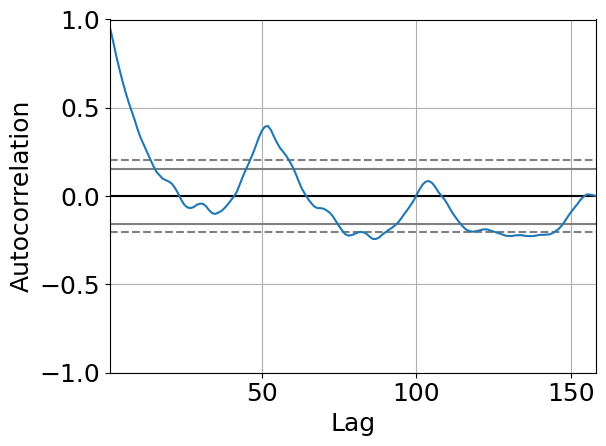

In [173]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

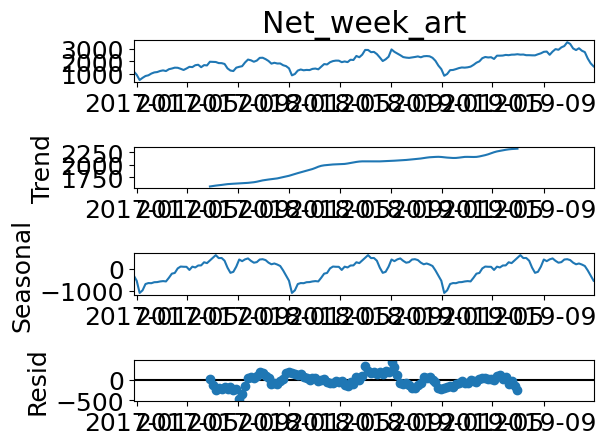

In [174]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [177]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                        1552078.509
Optimized:                         True   AIC                           1566.417
Trend:                   Multiplicative   BIC                           1740.985
Seasonal:                Multiplicative   AICC                          1638.662
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:11:21
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9950151                alpha                 True
smoothing_trend          

Testing for the fitting of model versus observed data.

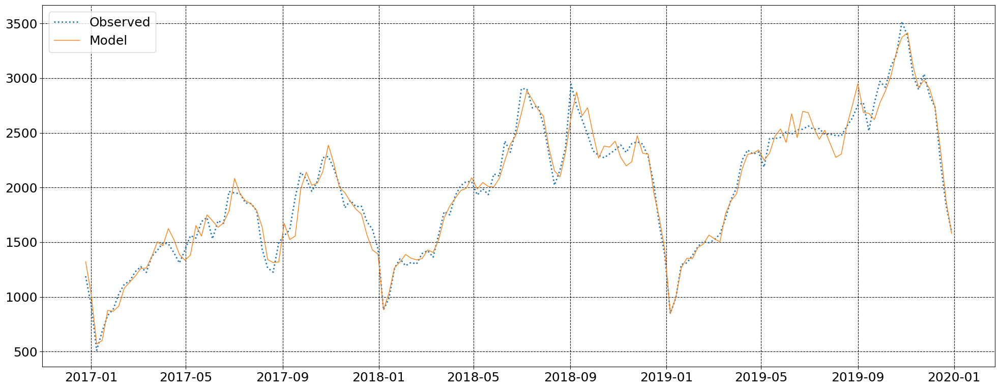

In [178]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)


Testing for forecasting on 2020.

In [179]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2017-01-01     927.0
2017-01-08     511.0
2017-01-15     684.0
2017-01-22     830.0
2017-01-29     888.0
               ...  
2020-11-29    3142.0
2020-12-06    3183.0
2020-12-13    3129.0
2020-12-20    3008.0
2020-12-27    2536.0
Name: Net_week_art, Length: 209, dtype: float64
2019-12-29    1595.0
2020-01-05    1011.0
2020-01-12    1100.0
2020-01-19    1602.0
Name: Net_week_art, dtype: float64


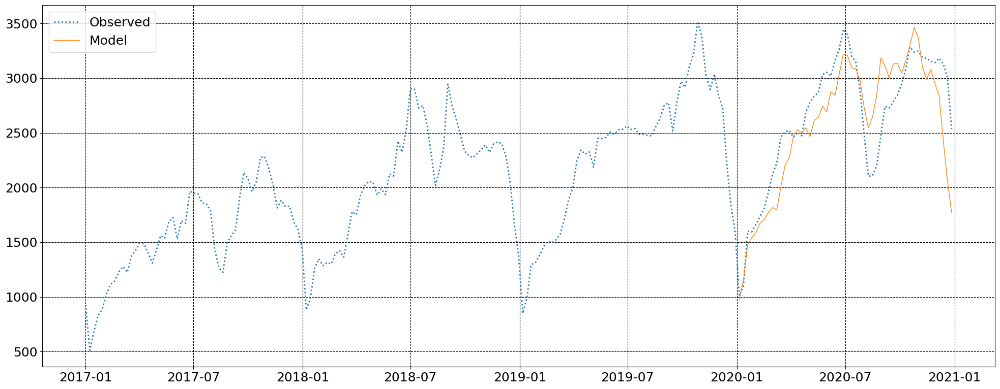

In [180]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# no need of below logic since initial estimation is used later
# ini_value=1521
# if np.abs(mod_result.fcastvalues[0]-ini_value)>500:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2020=forecast_2020-ini_value
#     else:
#         forecast_2020=ini_value-forecast_2020
# else:
#     forecast_2020=forecast_2020
mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,fname)

In [181]:
#2021 forecast time series
forecast_2020=mod_result.forecast(52)
forecast_2020=forecast_2020.round()
df=pd.DataFrame(forecast_2020,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_20.csv')
pd.Series.to_csv(df,fname)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [182]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2017-12-31    1439.0
2018-01-07     882.0
2018-01-14     988.0
2018-01-21    1263.0
2018-01-28    1348.0
               ...  
2020-11-29    3142.0
2020-12-06    3183.0
2020-12-13    3129.0
2020-12-20    3008.0
2020-12-27    2536.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        1766989.293
Optimized:                         True   AIC                           1578.581
Trend:                         Additive   BIC                           1752.787
Seasonal:                      Additive   AICC                          1651.571
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:13:10
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9791421                alpha                 True
smoothing_trend          

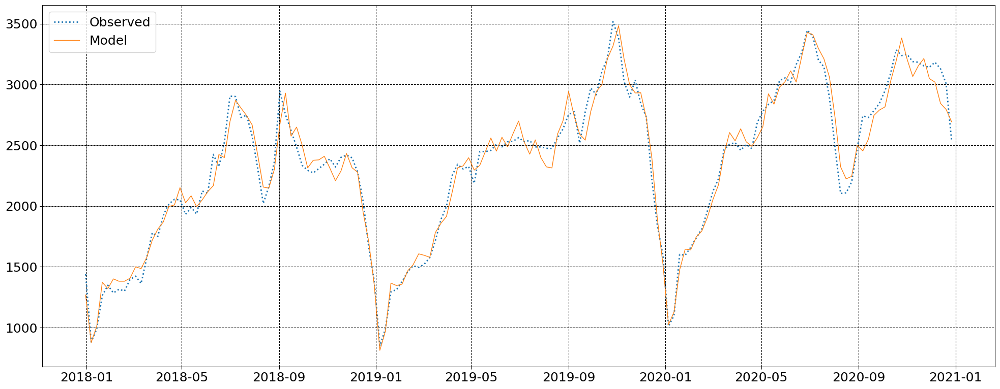

In [190]:
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='add',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='add',seasonal_periods=52*1,initialization_method='estimated')

mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

*Forecast for 2021*

In [191]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
print(vald21_ts[-53:-49])

2017-12-31    1439.0
2018-01-07     882.0
2018-01-14     988.0
2018-01-21    1263.0
2018-01-28    1348.0
               ...  
2021-12-05    3361.0
2021-12-12    3345.0
2021-12-19    3298.0
2021-12-26    3080.0
2022-01-02    2656.0
Name: Net_week_art, Length: 210, dtype: float64
2021-01-03    1668.0
2021-01-10    1368.0
2021-01-17    1910.0
2021-01-24    2136.0
Name: Net_week_art, dtype: float64


Plotting against observed

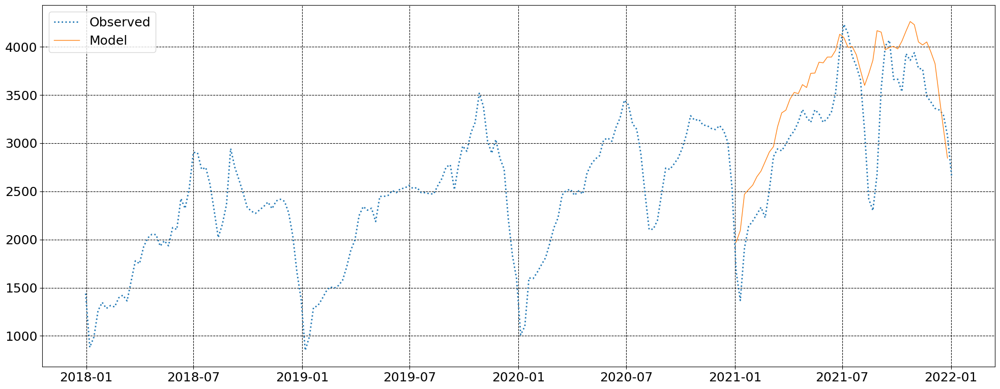

In [192]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
# ini_value=1276
# if np.abs(mod_result.fcastvalues[0]-ini_value)>1000:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2021=forecast_2021-ini_value
#     else:
#         forecast_2021=ini_value-forecast_2021
# else:
#     forecast_2021=forecast_2021
fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,fname)

In [193]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
df=pd.DataFrame(forecast_2021,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_21.csv')
pd.Series.to_csv(df,fname)

### Forecast 2022

Train data till 2021


In [194]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-01-06     850.0
2019-01-13     990.0
2019-01-20    1296.0
2019-01-27    1311.0
2019-02-03    1379.0
               ...  
2021-11-28    3428.0
2021-12-05    3361.0
2021-12-12    3345.0
2021-12-19    3298.0
2021-12-26    3080.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        3610396.109
Optimized:                         True   AIC                           1690.764
Trend:                         Additive   BIC                           1864.970
Seasonal:                      Additive   AICC                          1763.754
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:15:56
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9344218                alpha                 True
smoothing_trend          

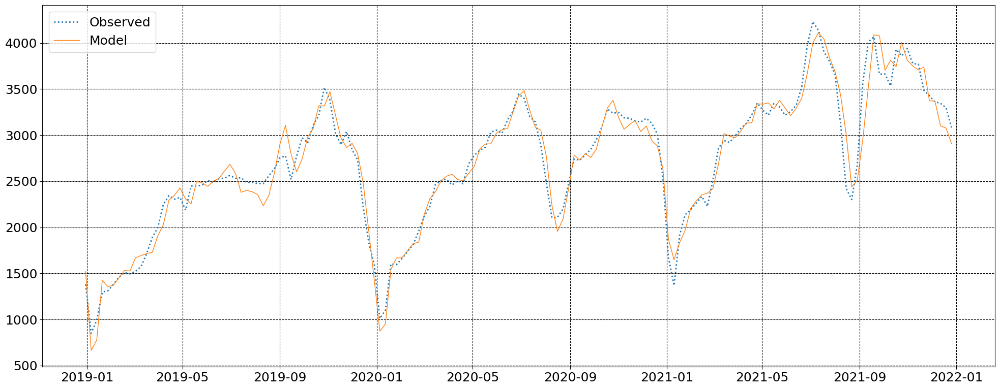

In [209]:
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='add',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='add',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [210]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2018-12-30    1380.0
2019-01-06     850.0
2019-01-13     990.0
2019-01-20    1296.0
2019-01-27    1311.0
               ...  
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
2022-12-25    2802.0
2023-01-01    2104.0
Name: Net_week_art, Length: 210, dtype: float64


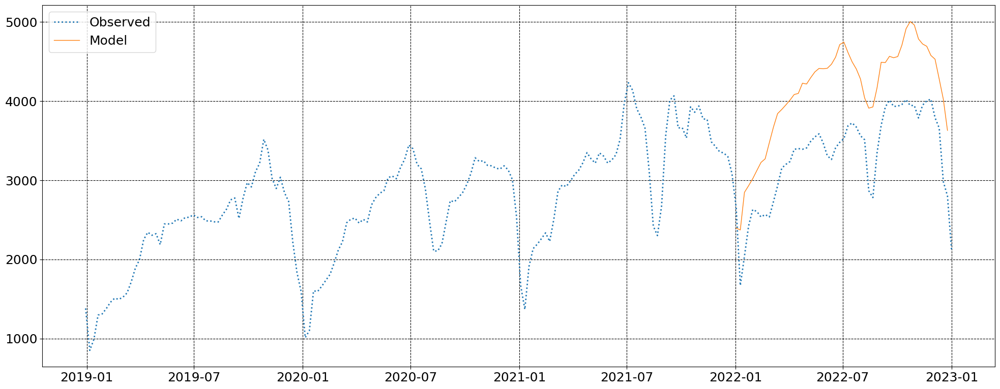

In [211]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,fname)

In [212]:
#2021 forecast time series
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
df=pd.DataFrame(forecast_2022,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_22.csv')
pd.Series.to_csv(df,fname)

### Forecast 2023

Train data till 2022


In [213]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-12-29    1595.0
2020-01-05    1011.0
2020-01-12    1100.0
2020-01-19    1602.0
2020-01-26    1595.0
               ...  
2022-11-20    4005.0
2022-11-27    4025.0
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        3434811.750
Optimized:                         True   AIC                           1682.937
Trend:                   Multiplicative   BIC                           1857.143
Seasonal:                Multiplicative   AICC                          1755.926
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:17:13
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9950000                alpha                 True
smoothing_trend          

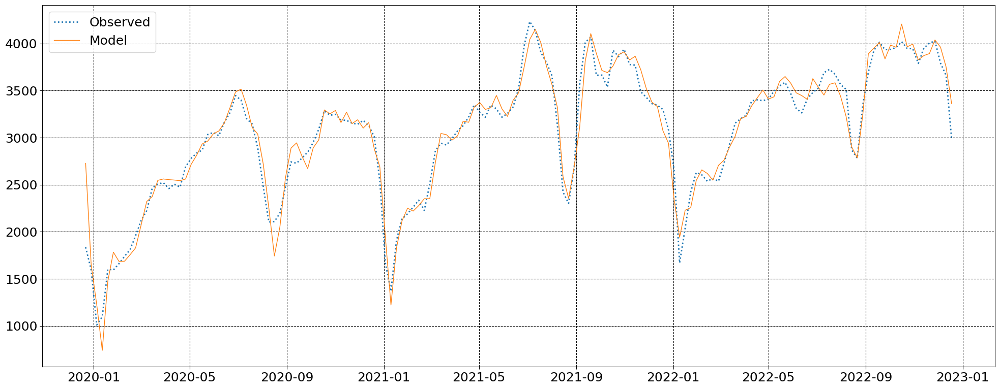

In [223]:
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [224]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2019-12-29    1595.0
2020-01-05    1011.0
2020-01-12    1100.0
2020-01-19    1602.0
2020-01-26    1595.0
               ...  
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
2022-12-25    2802.0
2023-01-01    2104.0
Name: Net_week_art, Length: 158, dtype: float64


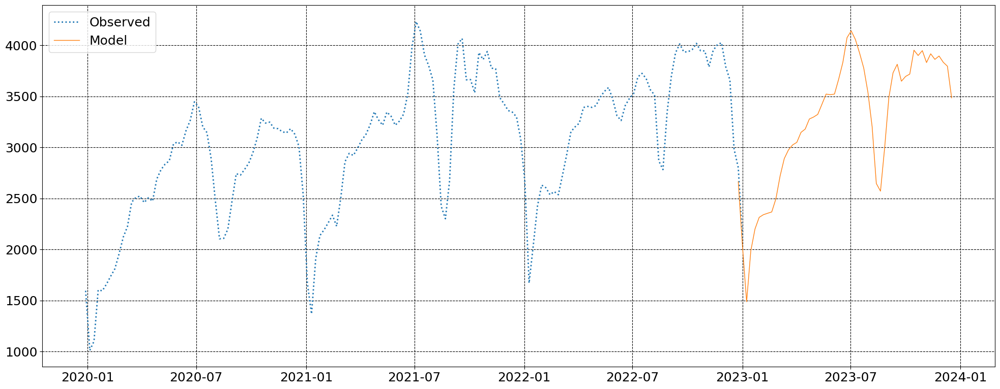

In [225]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,fname)

In [226]:
#2021 forecast time series
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
df=pd.DataFrame(forecast_2023,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_23.csv')
pd.Series.to_csv(df,fname)

## **A01-80-(30)**

In [227]:

importlib.reload(ff)
region='All Locations'
artikel_code='A01-80-(30)'
ini_start_year_train=2017
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2016-12-25     839.0
2017-01-01     696.0
2017-01-08     345.0
2017-01-15     420.0
2017-01-22     557.0
               ...  
2019-12-01    1714.0
2019-12-08    1733.0
2019-12-15    1621.0
2019-12-22    1391.0
2019-12-29    1195.0
Name: Net_week_art, Length: 158, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.925858857409654
-0.04426735175602687
0.6269088214745067
0.8888433253590005
0.007282600113636325


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

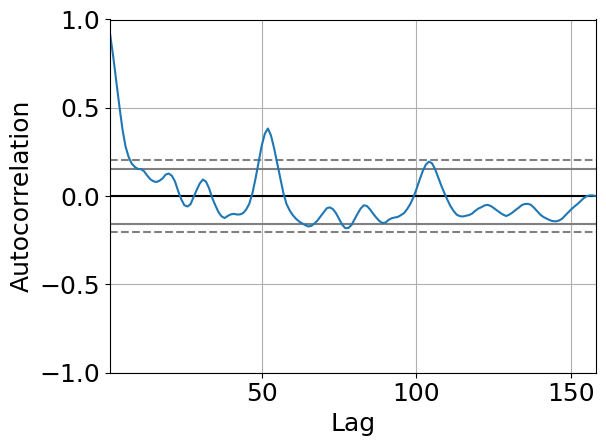

In [228]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

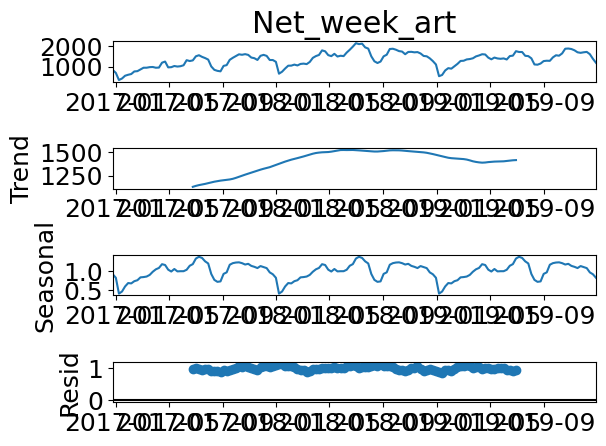

In [234]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='mul',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [239]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  158
Model:             ExponentialSmoothing   SSE                         695747.510
Optimized:                         True   AIC                           1439.643
Trend:                   Multiplicative   BIC                           1614.211
Seasonal:                Multiplicative   AICC                          1511.888
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         08:54:36
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9949978                alpha                 True
smoothing_trend          

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


Testing for the fitting of model versus observed data.

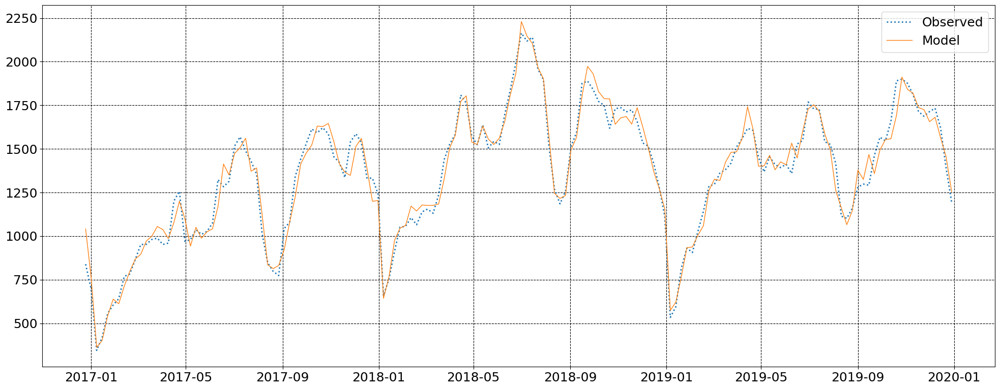

In [240]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)


Testing for forecasting on 2020.

In [241]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2017-01-01     696.0
2017-01-08     345.0
2017-01-15     420.0
2017-01-22     557.0
2017-01-29     605.0
               ...  
2020-11-29    1747.0
2020-12-06    1800.0
2020-12-13    1680.0
2020-12-20    1628.0
2020-12-27    1325.0
Name: Net_week_art, Length: 209, dtype: float64
2019-12-29    1195.0
2020-01-05     713.0
2020-01-12     552.0
2020-01-19     965.0
Name: Net_week_art, dtype: float64


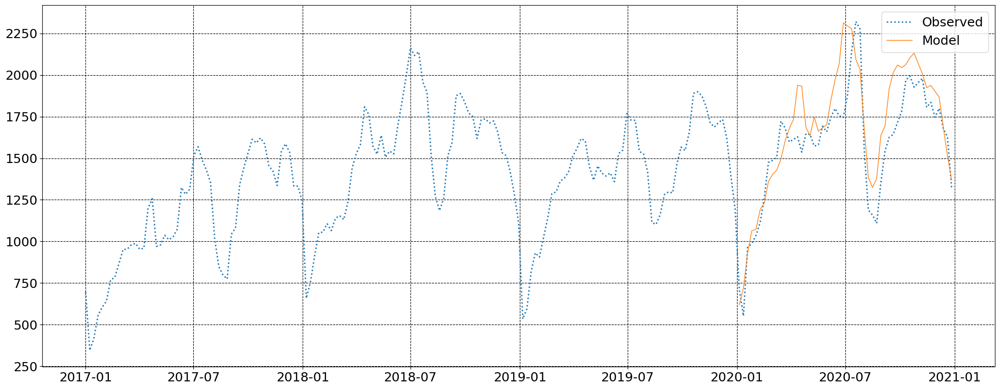

In [242]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# no need of below logic since initial estimation is used later
# ini_value=1521
# if np.abs(mod_result.fcastvalues[0]-ini_value)>500:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2020=forecast_2020-ini_value
#     else:
#         forecast_2020=ini_value-forecast_2020
# else:
#     forecast_2020=forecast_2020
mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,fname)

In [243]:
#2021 forecast time series
forecast_2020=mod_result.forecast(52)
forecast_2020=forecast_2020.round()
df=pd.DataFrame(forecast_2020,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_20.csv')
pd.Series.to_csv(df,fname)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [244]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2017-12-31    1243.0
2018-01-07     658.0
2018-01-14     755.0
2018-01-21     913.0
2018-01-28    1052.0
               ...  
2020-11-29    1747.0
2020-12-06    1800.0
2020-12-13    1680.0
2020-12-20    1628.0
2020-12-27    1325.0
Name: Net_week_art, Length: 157, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        1712659.974
Optimized:                         True   AIC                           1573.678
Trend:                   Multiplicative   BIC                           1747.884
Seasonal:                Multiplicative   AICC                          1646.668
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         08:56:21
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.6584550                alpha                 True
smoothing_trend          

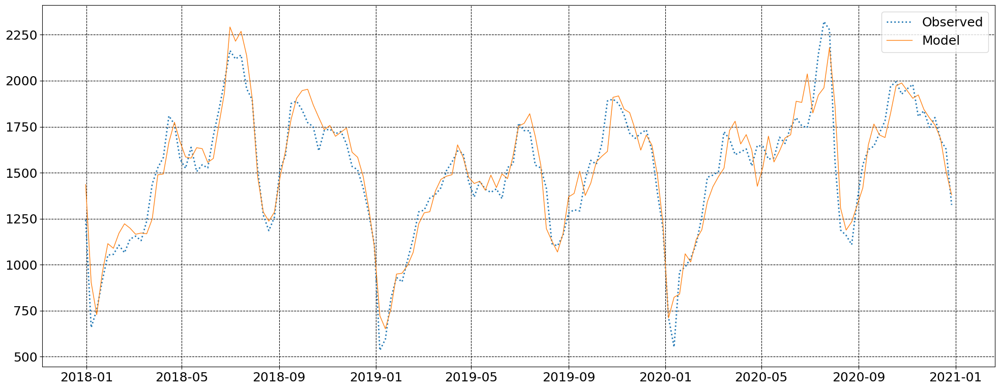

In [248]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')

mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

*Forecast for 2021*

In [246]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
print(vald21_ts[-53:-49])

2017-12-31    1243.0
2018-01-07     658.0
2018-01-14     755.0
2018-01-21     913.0
2018-01-28    1052.0
               ...  
2021-12-05    1999.0
2021-12-12    1963.0
2021-12-19    1939.0
2021-12-26    1904.0
2022-01-02    1548.0
Name: Net_week_art, Length: 210, dtype: float64
2021-01-03     784.0
2021-01-10     599.0
2021-01-17    1025.0
2021-01-24    1133.0
Name: Net_week_art, dtype: float64


Plotting against observed

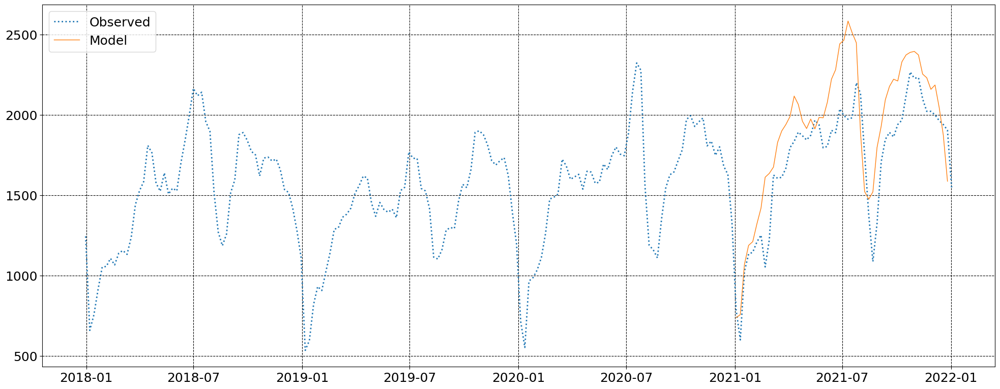

In [247]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
# ini_value=1276
# if np.abs(mod_result.fcastvalues[0]-ini_value)>1000:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2021=forecast_2021-ini_value
#     else:
#         forecast_2021=ini_value-forecast_2021
# else:
#     forecast_2021=forecast_2021
fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,fname)

In [ ]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
df=pd.DataFrame(forecast_2021,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_21.csv')
pd.Series.to_csv(df,fname)

### Forecast 2022

Train data till 2021


In [ ]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-01-06     850.0
2019-01-13     990.0
2019-01-20    1296.0
2019-01-27    1311.0
2019-02-03    1379.0
               ...  
2021-11-28    3428.0
2021-12-05    3361.0
2021-12-12    3345.0
2021-12-19    3298.0
2021-12-26    3080.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        3610396.109
Optimized:                         True   AIC                           1690.764
Trend:                         Additive   BIC                           1864.970
Seasonal:                      Additive   AICC                          1763.754
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:15:56
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9344218                alpha                 True
smoothing_trend          

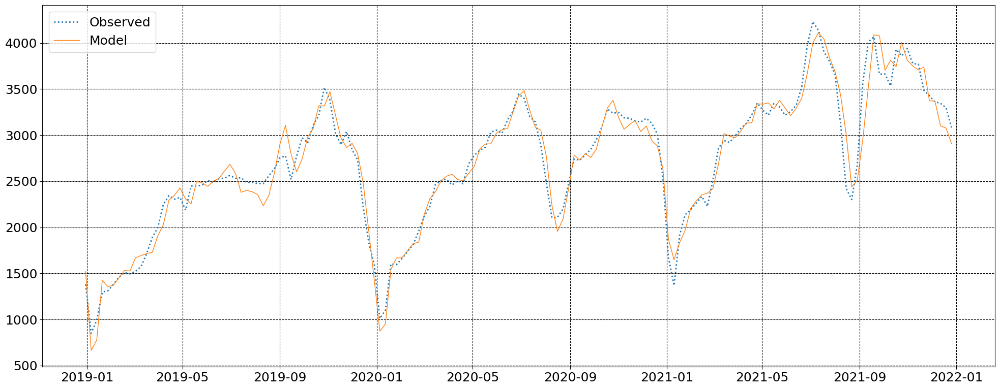

In [ ]:
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='add',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='add',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [ ]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2018-12-30    1380.0
2019-01-06     850.0
2019-01-13     990.0
2019-01-20    1296.0
2019-01-27    1311.0
               ...  
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
2022-12-25    2802.0
2023-01-01    2104.0
Name: Net_week_art, Length: 210, dtype: float64


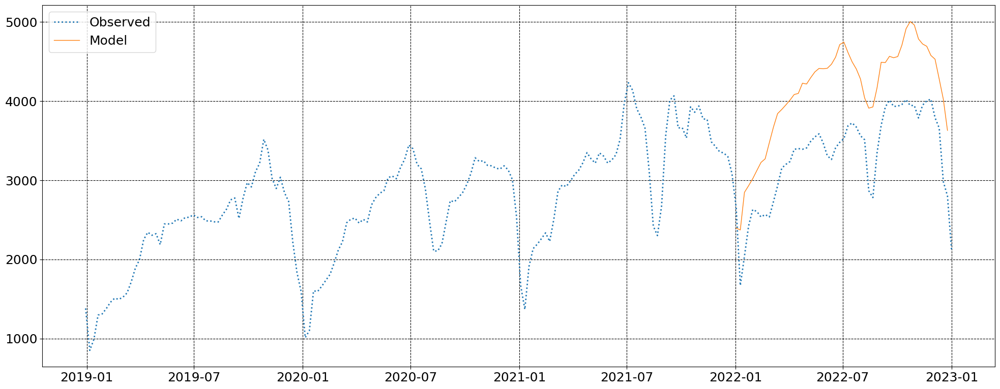

In [ ]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,fname)

In [ ]:
#2021 forecast time series
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
df=pd.DataFrame(forecast_2022,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_22.csv')
pd.Series.to_csv(df,fname)

### Forecast 2023

Train data till 2022


In [ ]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2019-12-29    1595.0
2020-01-05    1011.0
2020-01-12    1100.0
2020-01-19    1602.0
2020-01-26    1595.0
               ...  
2022-11-20    4005.0
2022-11-27    4025.0
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
Name: Net_week_art, Length: 156, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  157
Model:             ExponentialSmoothing   SSE                        3434811.750
Optimized:                         True   AIC                           1682.937
Trend:                   Multiplicative   BIC                           1857.143
Seasonal:                Multiplicative   AICC                          1755.926
Seasonal Periods:                    52   Date:                 Tue, 20 Dec 2022
Box-Cox:                          False   Time:                         23:17:13
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9950000                alpha                 True
smoothing_trend          

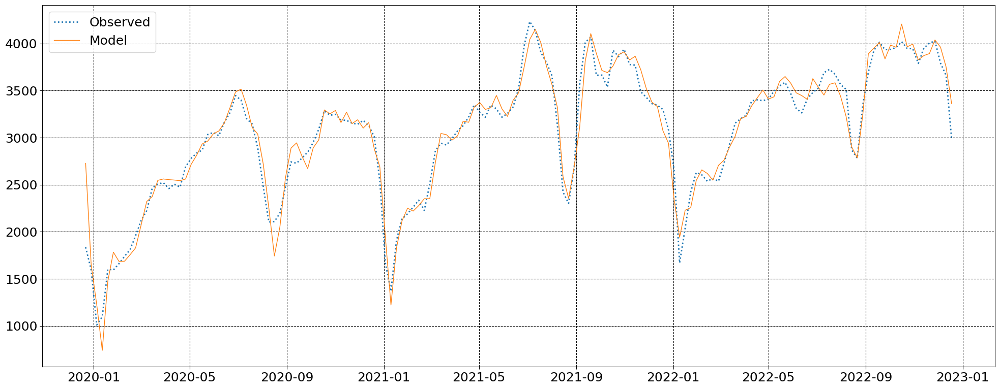

In [ ]:
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='add',seasonal='mul',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [ ]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2019-12-29    1595.0
2020-01-05    1011.0
2020-01-12    1100.0
2020-01-19    1602.0
2020-01-26    1595.0
               ...  
2022-12-04    3791.0
2022-12-11    3661.0
2022-12-18    2983.0
2022-12-25    2802.0
2023-01-01    2104.0
Name: Net_week_art, Length: 158, dtype: float64


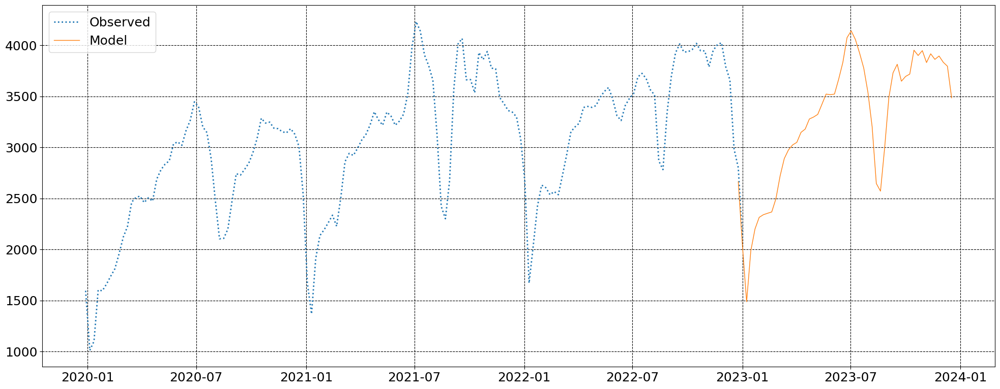

In [ ]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,fname)

In [ ]:
#2021 forecast time series
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
df=pd.DataFrame(forecast_2023,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_23.csv')
pd.Series.to_csv(df,fname)

## **C02-80**

In [343]:

importlib.reload(ff)
region='All Locations'
artikel_code='C02-80'
ini_start_year_train=2015
end_year_train=2019
artikel_ts,train_ts=ff.get_data_series(region,artikel_code,dirname,ini_start_year_train,end_year_train)
# print('Training series is:'+str(train_ts))
train_ts=train_ts[2:]
print('Training series is:'+str(train_ts))

Training series is:2014-12-28     70.0
2015-01-04     39.0
2015-01-11     39.0
2015-01-18     51.0
2015-01-25     58.0
              ...  
2019-12-01    136.0
2019-12-08    132.0
2019-12-15    136.0
2019-12-22    130.0
2019-12-29    126.0
Name: Net_week_art, Length: 262, dtype: float64


### ***Model Developement and Validation***

Note that some time one needs to adjust the training time seires to have a correct prediction start.

#### Time series analysis

Now we plot a Auto correlation of the time series to see whether it correlates to a yearly data.

0.9511508681113845
0.501105771837082
0.756435489972591
0.6121312913222554
0.19429480116643863


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

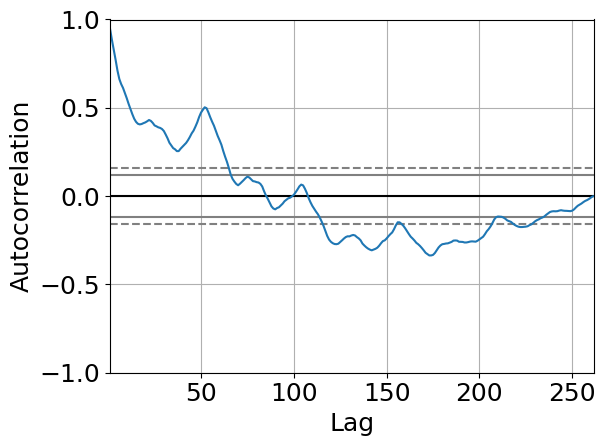

In [344]:
# lags based on weeks
lagvec=[1,25,52,52*2,int(52*2.5)]
for lag in lagvec:
    x=train_ts.autocorr(lag=lag)
    print(x)
pd.plotting.autocorrelation_plot(train_ts)

Seems like the series has a nice correlation for a year data (around 52 weeks) and also 26 weeks. The correlation goes down for 2 or larger years. 

#### Decomposing the series

The series can be decomposed into trend, sesonality and residual.

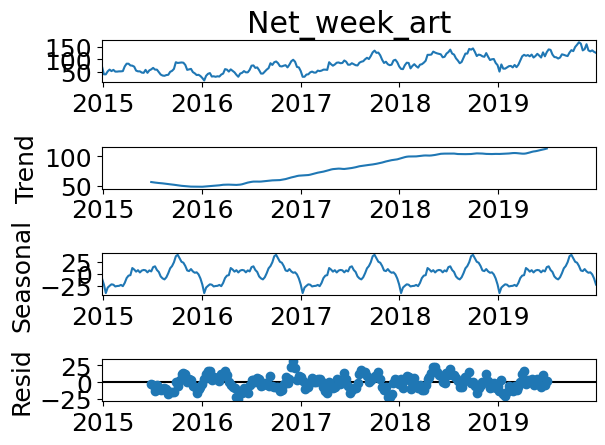

In [345]:
import statsmodels.api as sm
result=sm.tsa.seasonal_decompose(train_ts,model='add',period=52*1)

# plt.figure*()
fig1=result.plot()
fig1.tight_layout()

There is clearly an increasing trend which migh plateau in 2020. Importantly the seasonality pattern suggests that there are definite times in the year when certain orders are placed. 

**Important**

The residual (resid) gives a hint that these are spurious orders over the years which have will be difficult to be captured by the prediction algorithm. Thus, we can say that the uncertainty in our prediction would be around the max of this residual i.e. *250*


#### Model

In [346]:
model_20=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='add',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model_20.fit()#location
# mod_result=model_20.fit(remove_bias=True)
artikel_data_loc=os.path.join(forecast_data,region,artikel_code)
summary_loc=os.path.join(artikel_data_loc,'model_summary.data')
with open(summary_loc,'w') as f:
    f.write(str(mod_result.summary()))

print(mod_result.summary())

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  262
Model:             ExponentialSmoothing   SSE                          16781.438
Optimized:                         True   AIC                           1203.837
Trend:                   Multiplicative   BIC                           1407.233
Seasonal:                      Additive   AICC                          1238.887
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         09:34:55
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.8937666                alpha                 True
smoothing_trend          

/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


Testing for the fitting of model versus observed data.

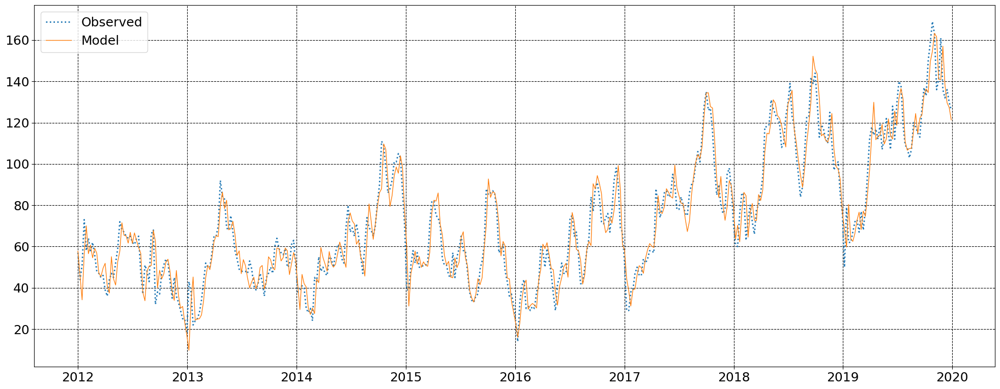

In [333]:
importlib.reload(ff)
fname=os.path.join(artikel_data_loc,'Testing_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)


Testing for forecasting on 2020.

In [334]:
#2020 observations ts
start_year_train=ini_start_year_train
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
vald_ts=artikel_ts[start:start+52*end_int+1]
print(vald_ts)
print(vald_ts[-53:-49])
#take initial 1521 at week 1

2012-01-08     44.0
2012-01-15     51.0
2012-01-22     73.0
2012-01-29     58.0
2012-02-05     64.0
              ...  
2020-11-29    177.0
2020-12-06    161.0
2020-12-13    164.0
2020-12-20    143.0
2020-12-27    135.0
Name: Net_week_art, Length: 469, dtype: float64
2019-12-29    126.0
2020-01-05     88.0
2020-01-12     74.0
2020-01-19    104.0
Name: Net_week_art, dtype: float64


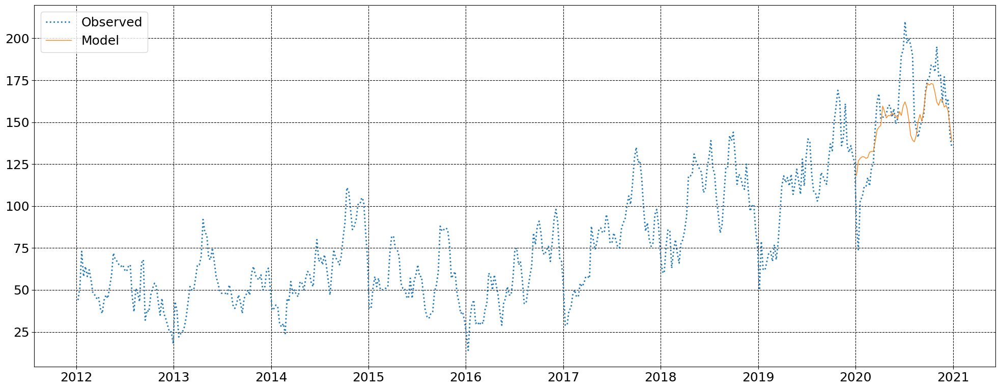

In [335]:
importlib.reload(ff)
forecast_2020=mod_result.forecast(52)
# no need of below logic since initial estimation is used later
# ini_value=1521
# if np.abs(mod_result.fcastvalues[0]-ini_value)>500:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2020=forecast_2020-ini_value
#     else:
#         forecast_2020=ini_value-forecast_2020
# else:
#     forecast_2020=forecast_2020
mod_net=pd.concat([mod_result.fittedvalues,forecast_2020])
fname=os.path.join(artikel_data_loc,'Testing_Forecast_2020.jpg')
ff.plot_mod_obs(vald_ts,forecast_2020,fname)

In [331]:
model_20.forecast 

AttributeError: 'ExponentialSmoothing' object has no attribute 'forecast'

In [287]:
#2021 forecast time series
forecast_2020=mod_result.forecast(52)
forecast_2020=forecast_2020.round()
df=pd.DataFrame(forecast_2020,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_20.csv')
pd.Series.to_csv(df,fname)

### Validation

(Corona Effect)

Now the train_ts is replaced by the validation ts and a 2021 forecast is made

In [295]:
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2021-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts)

2013-01-06     43.0
2013-01-13     38.0
2013-01-20     22.0
2013-01-27     24.0
2013-02-03     25.0
              ...  
2020-11-29    177.0
2020-12-06    161.0
2020-12-13    164.0
2020-12-20    143.0
2020-12-27    135.0
Name: Net_week_art, Length: 417, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  417
Model:             ExponentialSmoothing   SSE                          30378.492
Optimized:                         True   AIC                           1902.264
Trend:                   Multiplicative   BIC                           2132.150
Seasonal:                      Additive   AICC                          1922.096
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         09:22:28
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9539504                alpha                 True
smoothing_trend          

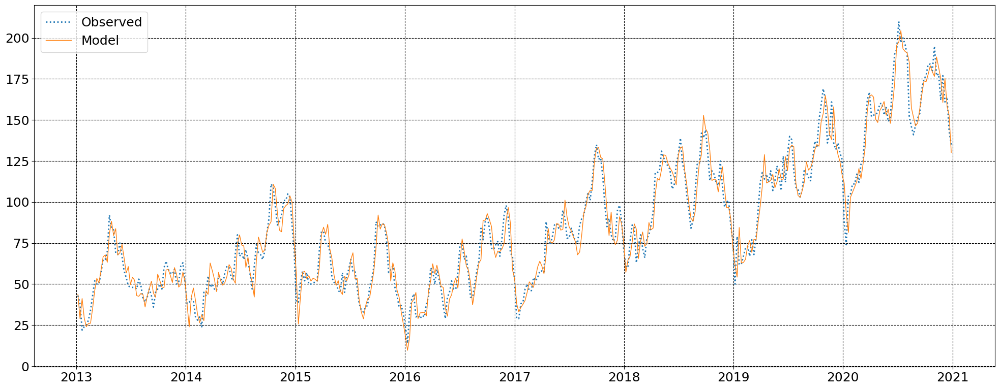

In [296]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='add',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='mul',seasonal_periods=52*1,initialization_method='estimated')

mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

*Forecast for 2021*

In [297]:
#2021 observations ts
start_year_train=ini_start_year_train+1
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
vald21_ts=artikel_ts[start:start+52*end_int+2]
print(vald21_ts)
print(vald21_ts[-53:-49])

2013-01-06     43.0
2013-01-13     38.0
2013-01-20     22.0
2013-01-27     24.0
2013-02-03     25.0
              ...  
2021-12-05    139.0
2021-12-12    132.0
2021-12-19    136.0
2021-12-26    127.0
2022-01-02    114.0
Name: Net_week_art, Length: 470, dtype: float64
2021-01-03     97.0
2021-01-10     85.0
2021-01-17    117.0
2021-01-24    126.0
Name: Net_week_art, dtype: float64


Plotting against observed

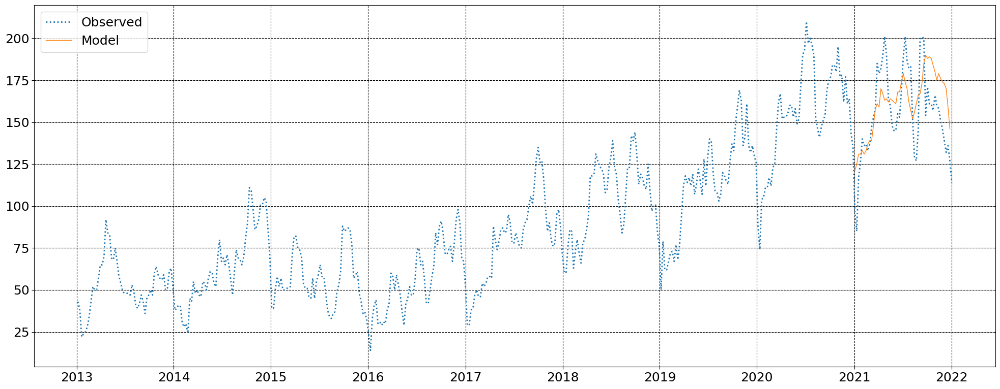

In [298]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
# ini_value=1276
# if np.abs(mod_result.fcastvalues[0]-ini_value)>1000:
#     if mod_result.fcastvalues[0]>ini_value:
#         forecast_2021=forecast_2021-ini_value
#     else:
#         forecast_2021=ini_value-forecast_2021
# else:
#     forecast_2021=forecast_2021
fname=os.path.join(artikel_data_loc,'Validation_forecastt_2021.jpg')
ff.plot_mod_obs(vald21_ts,forecast_2021,fname)

In [299]:
#2021 forecast time series
forecast_2021=mod_result.forecast(52)
forecast_2021=forecast_2021.round()
df=pd.DataFrame(forecast_2021,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_21.csv')
pd.Series.to_csv(df,fname)

### Forecast 2022

Train data till 2021


In [307]:
#2022 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2022-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2014-01-12     39.0
2014-01-19     41.0
2014-01-26     40.0
2014-02-02     30.0
2014-02-09     28.0
              ...  
2021-11-28    146.0
2021-12-05    139.0
2021-12-12    132.0
2021-12-19    136.0
2021-12-26    127.0
Name: Net_week_art, Length: 416, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  417
Model:             ExponentialSmoothing   SSE                          38945.418
Optimized:                         True   AIC                           2005.858
Trend:                   Multiplicative   BIC                           2235.744
Seasonal:                      Additive   AICC                          2025.690
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         09:26:45
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9986341                alpha                 True
smoothing_trend          

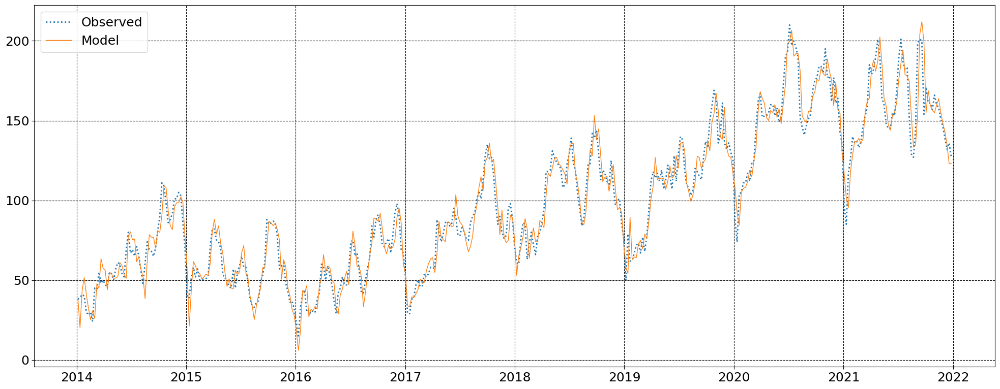

In [315]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='add',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='add',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2022.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [316]:
#2021 observations ts
start_year_train=ini_start_year_train+2
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald22_ts=artikel_ts[start:start+52*end_int+2]
print(vald22_ts)
# print(vald22_ts[-53:-49])


2014-01-05     38.0
2014-01-12     39.0
2014-01-19     41.0
2014-01-26     40.0
2014-02-02     30.0
              ...  
2022-12-04    145.0
2022-12-11    135.0
2022-12-18    135.0
2022-12-25    121.0
2023-01-01     94.0
Name: Net_week_art, Length: 470, dtype: float64


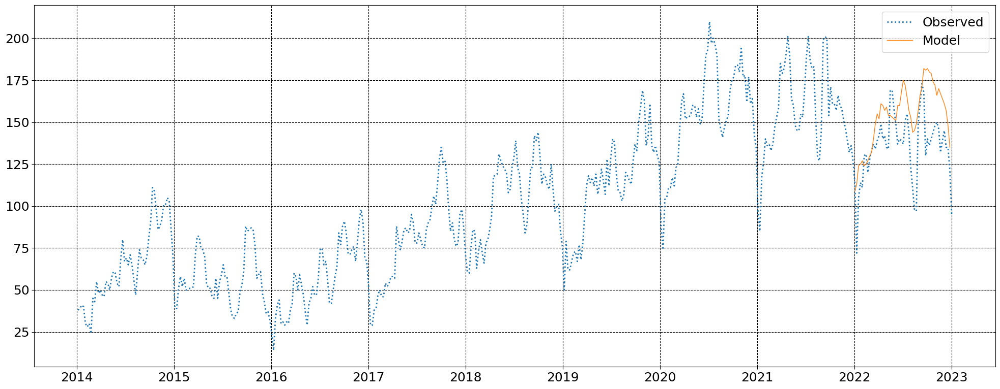

In [317]:
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
#since the forecast depends on the starting value
# forecast_2022=forecast_2022-1920
mod_net=pd.concat([mod_result.fittedvalues,forecast_2022])
#2021 forecast time series
fname=os.path.join(artikel_data_loc,'Forecast22.jpg')
ff.plot_mod_obs(vald22_ts,forecast_2022,fname)

In [318]:
#2021 forecast time series
forecast_2022=mod_result.forecast(52)
forecast_2022=forecast_2022.round()
df=pd.DataFrame(forecast_2022,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_22.csv')
pd.Series.to_csv(df,fname)

### Forecast 2023

Train data till 2022


In [319]:
#2023 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52-1)
end_int=int(2023-start_year_train)
train_ts=artikel_ts[start:start+52*end_int+1]
print(train_ts[1:])

2015-01-04     39.0
2015-01-11     39.0
2015-01-18     51.0
2015-01-25     58.0
2015-02-01     52.0
              ...  
2022-11-20    132.0
2022-11-27    139.0
2022-12-04    145.0
2022-12-11    135.0
2022-12-18    135.0
Name: Net_week_art, Length: 416, dtype: float64


/home/amey/anaconda3/envs/buko_infra/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:             Net_week_art   No. Observations:                  417
Model:             ExponentialSmoothing   SSE                          46306.013
Optimized:                         True   AIC                           2078.045
Trend:                   Multiplicative   BIC                           2307.931
Seasonal:                      Additive   AICC                          2097.877
Seasonal Periods:                    52   Date:                 Wed, 21 Dec 2022
Box-Cox:                          False   Time:                         09:27:26
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.9273799                alpha                 True
smoothing_trend          

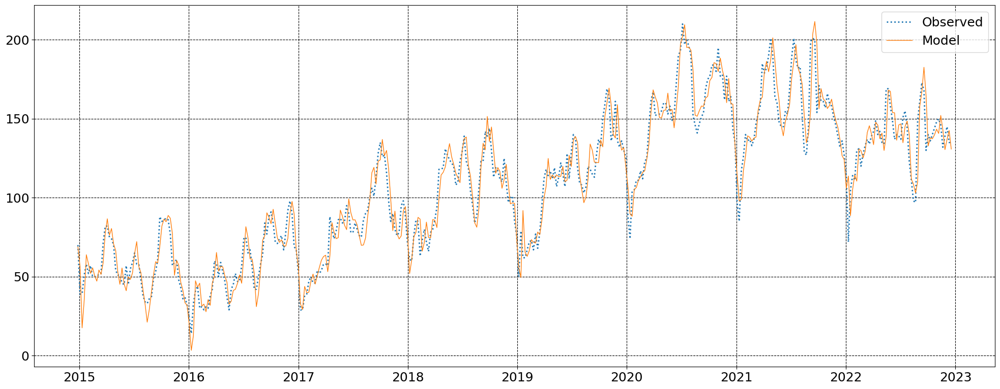

In [320]:
model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='add',seasonal_periods=52*1,initialization_method='known',initial_level=model_20._initial_level,initial_seasonal=model_20._initial_seasonal,initial_trend=model_20._initial_trend)
# model=ExponentialSmoothing(train_ts,damped_trend=True,trend='mul',seasonal='add',seasonal_periods=52*1,initialization_method='estimated')
mod_result=model.fit()
fname=os.path.join(artikel_data_loc,'Validation_Fit_2023.jpg')
ff.plot_mod_obs(train_ts,mod_result.fittedvalues,fname)
print(mod_result.summary())

In [321]:
#2022 observations ts
start_year_train=ini_start_year_train+3
start=int((start_year_train-2007)*52)
end_int=int(2023-start_year_train)
vald23_ts=artikel_ts[start:start+52*end_int+2]
print(vald23_ts)
# print(vald22_ts[-53:-49])


2015-01-04     39.0
2015-01-11     39.0
2015-01-18     51.0
2015-01-25     58.0
2015-02-01     52.0
              ...  
2022-12-04    145.0
2022-12-11    135.0
2022-12-18    135.0
2022-12-25    121.0
2023-01-01     94.0
Name: Net_week_art, Length: 418, dtype: float64


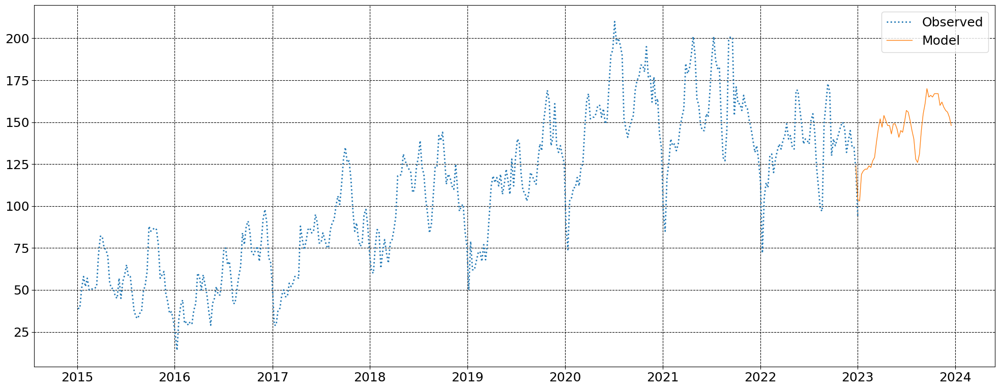

In [322]:
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()

mod_net=pd.concat([mod_result.fittedvalues,forecast_2023])

fname=os.path.join(artikel_data_loc,'Forecast23.jpg')
ff.plot_mod_obs(vald23_ts,forecast_2023,fname)

In [323]:
#2021 forecast time series
forecast_2023=mod_result.forecast(52)
forecast_2023=forecast_2023.round()
df=pd.DataFrame(forecast_2023,columns=['Net_Artikels'])
fname=os.path.join(artikel_data_loc,'Forecast_23.csv')
pd.Series.to_csv(df,fname)